In [1]:
import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from tpot import TPOTRegressor
import matplotlib.pyplot as plt 
from scipy import stats
from scipy.stats import mstats
from sklearn import preprocessing
from sklearn.decomposition import PCA
from catboost import CatBoostRegressor, Pool, cv

In [2]:
# load dataset
import codecs
file = "nhanes_III_merged_v3.tsv"
doc = codecs.open(file,'rU','UTF-8') #open for reading with "universal" type set
df = pd.read_csv(doc, sep='\t')

# pull the relevant markers, which have been used in other age calculators

# Mamoshina, P., et al., Population Specific Biomarkers of Human Aging: A Big Data Study Using South Korean, Canadian, and Eastern European Patient Populations. J Gerontol A Biol Sci Med Sci, 2018. 73(11): p. 1482-1490.
# Westerman, K., et al., Longitudinal analysis of biomarker data from a personalized nutrition platform in healthy subjects. Sci Rep, 2018. 8(1): p. 14685.
# Zhong, X., et al., Estimating Biological Age in the Singapore Longitudinal Aging Study. J Gerontol A Biol Sci Med Sci, 2019.
# Jee, H., Selection of a set of biomarkers and comparisons of biological age estimation models for Korean men. J Exerc Rehabil, 2019. 15(1): p. 31-36.
# Pyrkov, T.V., et al., Extracting biological age from biomedical data via deep learning: too much of a good thing? Sci Rep, 2018. 8(1): p. 5210.
# Wang, Z., et al., Predicting age by mining electronic medical records with deep learning characterizes differences between chronological and physiological age. J Biomed Inform, 2017. 76: p. 59-68.
# Hertel, J., et al., Measuring Biological Age via Metabonomics: The Metabolic Age Score. J Proteome Res, 2016. 15(2): p. 400-10.
# Ravera, S., et al., Discrete Changes in Glucose Metabolism Define Aging. Sci Rep, 2019. 9(1): p. 10347.
# Nakamura, E. and K. Miyao, A method for identifying biomarkers of aging and constructing an index of biological age in humans. J Gerontol A Biol Sci Med Sci, 2007. 62(10): p. 1096-105.

df = df[[
'HSAGEIR', # Age
'AMP', # Serum albumin (g/dL)
'CEP', # Serum creatinine (mg/dL)
'G1P', # Plasma glucose (mg/dL)
#'CRP', # Serum C-reactive protein (mg/dL) misleading...
'LMPPCNT', # Lymphocyte percent (Coulter)
'MVPSI', # Mean cell volume: SI (fL)
'RWP', # Red cell distribution width (%) https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2765040/
'APPSI', # Serum alkaline phosphatase: SI (U/L)
'WCP', # White blood cell count https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6295779/
'HSSEX', # Sex 1- male, 2 female
'PEPMNK5R', # Overall average K5, diastolic, BP
'PEPMNK1R', # Overall average K1, systolic, BP
'PEP6DR', # Radial pulse rate
'BMPWT', # Weight (kg)
'BMPHT', # Standing height (cm)
'BMPWAIST', # Waist circumference (cm)
'TGPSI', # Serum triglycerides: SI (mmol/L)
'HDPSI', # Serum HDL cholesterol: SI (mmol/L)
'BUP', # Serum blood urea nitrogen (mg/dL)
'BMPWHR', # waist-to-hip ratio
'RCPSI', # Red blood cell count
'HTP',  # Hematocrit (%),
'ASPSI', # Serum aspartate aminotransferase: SI (U/L)
'ATPSI', # Serum alanine aminotransferase: SI (U/L)
#'DWP', # Platelet distribution width (%)
#'GHP', # Glycated hemoglobin: (%)
#'HGP', # Hemoglobin (g/dL)
#'TBP', # Serum total bilirubin (mg/dL)
# 'GRPPCNT', # Granulocyte percent (Coulter) 
#'OSPSI', # Serum osmolality: SI (mmol/Kg) 
'MHP', # Mean cell hemoglobin concentration
'PLP', # Platelet count 
'TPP', # Serum total protein (g/dL)
# 'MOPDIF', # Monocytes (percent of 100 cells)
# 'LMPDIF', # Lymphocytes (percent of 100 cells) 
#'FRPSI', # Serum ferritin: SI (ug/L)    
# 'FEPSI', # Serum iron: SI (umol/L) 
#'NAPSI', # Serum sodium: SI (mmol/L)
#'PSPSI', # Serum phosphorus: SI (mmol/L)   
'SCPSI', # Serum total calcium: SI (mmol/L)  might be usefull https://www.ncbi.nlm.nih.gov/pubmed/7993926
#'SKPSI', # Serum potassium: SI (mmol/L)   
#'LDPSI', # Serum lactate dehydrogenase: SI (U/L)    
'PEP13A', # health status: 1 Excellent, 2 Very good, 3 Good, 4 Fair, 5 Poor, 8 Blank but applicable 
'DMARACER', # race 1 - White, 2 - Black, 3 - Other, 8 - Mexican-American of unknown race
]]

# replace 8 (Mexican-American of unknown race) by 4
df.loc[df['DMARACER'] == 8, ['DMARACER']] = 4

# drop sick people
#df = df[df['PEP13A'] != 8] # Health status unknown
df = df[df['PEP13A'] != 5] # Health status poor

# superdrop
# in case if we need to use more features it keeps as many features as possible by recursively removing missing values, rows and columns
# while df.isnull().values.any():
#     nulls_in_rows = df.isnull().sum(axis=1)
#     df = df[nulls_in_rows != max(nulls_in_rows)].reset_index(drop=True).dropna(axis='columns', how='all').copy()

# useless...
# body surface area https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5313586/
# 1=MALE 2=FEMALE
# def BSE_calc(x):
#     if x[0] == 1:
#         return 0.0051*x[2]**0.8516*x[1]**0.3262*np.exp(-0.0120*1)*np.exp(0.0036*(x[1]/(x[2]/100)**2))
#     else:
#         return 0.0051*x[2]**0.8516*x[1]**0.3262*np.exp(-0.0120*0)*np.exp(0.0036*(x[1]/(x[2]/100)**2))
# body surface area 
#df['BSA'] = df[['HSSEX', 'BMPWT', 'BMPHT']].apply(BSE_calc, axis=1)


# anthropometric traits

# hip circumference
df['HIP'] = df['BMPWAIST']/df['BMPWHR']

# body HI https://www.hindawi.com/journals/jobe/2016/8094275/
df['HI'] = (df['HIP']) * ((df['BMPHT']/160)**0.31) * ((df['BMPWT']/73)**-0.482)
  
# Waist-to-height ratio
df['WHtR'] = df['BMPWAIST']/df['BMPHT']

# Waist to hip ratio
df['BMPWHR'] = df['BMPWHR']

# Ponderal Index
df['PI'] = df['BMPWT']/((df['BMPHT']/100)**3)

# Body adiposity index - useless
# df['BAI'] = df['BMPWAIST']/df['BMPWHR'] / ((df['BMPHT']/100) * (df['BMPHT']/100)**0.5) - 18

# https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0039504
# A Body Shape Index (ABSI) - the most useful one
df['ABSI'] = df['BMPWAIST']/100  / ( (df['BMPWT'] / (df['BMPHT']/100)**2)**(2/3)*((df['BMPHT']/100)**(1/2)) )

# the existence of chronic renal insufficiency
# https://www.ncbi.nlm.nih.gov/pubmed/21623470
# 1=MALE 2=FEMALE
# HUGE < 0 = normal renal function
# HUGE ≥ 0 = chronic kidney disease
df['HUGE'] = 2.505458 - (0.264418 * df['HTP']) + (0.118100 * df['BUP']) + (- 1.383960 * (df['HSSEX']-2))

# *** liver function ***
#  inspired by noninvasive fibrosis score FIB-4 https://www.ncbi.nlm.nih.gov/pubmed/17567829
df['FIB'] = df['ASPSI'] / (df['PLP'] * (df['ATPSI']**1/2))

# AST to platelet ratio index (APRI) for the noninvasive evaluation of liver fibrosis
# https://www.ncbi.nlm.nih.gov/pubmed/19034235
df['APRI'] = df['ATPSI']/df['PLP']

# https://en.wikipedia.org/wiki/AST/ALT_ratio
df['AST2ALT'] = df['ASPSI']/df['ATPSI']

# use mean arterial pressure instead of blood pressure
# https://www.jstage.jst.go.jp/article/ahs1995/14/6/14_6_293/_pdf/-char/en
df['MAP'] = df['PEPMNK5R'] + 0.01*np.exp(4.14 - 40.74/df['PEP6DR'])*(df['PEPMNK1R']-df['PEPMNK5R'])

# MAP to body surface area ratio - organs perfusion?
#df['MAP2BSA'] = df['MAP']/df['BSA']

# Atherogenic index of plasma
# https://www.tandfonline.com/doi/full/10.1080/08037051.2019.1583060
df['AIP'] = np.log10(df['TGPSI']/df['HDPSI'])

# creatinine to body surface area ratio
# df['C2BSA'] = df['CEP']/df['BSA']

# blood urea nitrogen to serum albumin ratio 
df['BUP2AMP'] = df['BUP']/df['AMP']

# this ratio might be a potential indicator of an increased catabolic burden generally coexisting with PEM and inflammation
# BUN-to-creatinine ratio
df['B2C'] = df['BUP']/df['CEP']

# C reactive protein/albumin ratio * 100
# https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6210319/
# df['CRP2A'] = df['CRP']/df['AMP']

# GL/ALB ratio https://www.jstage.jst.go.jp/article/jpa/22/1/22_1_37/_article
# https://www.hindawi.com/journals/bmri/2016/4697017/tab3/
df['G2A'] = (df['TPP'] - df['AMP']) / df['AMP']

# Corrected calcium = serum calcium mg/dL + 0.8 * (4 - serum albumin g/dL)
# Ca mmol/L to mg/dL as x4
# https://www.ncbi.nlm.nih.gov/pubmed/24800488
#df['CSCPSI'] = 4 * df['SCPSI'] + 0.8 * (4 - df['AMP'])

# drop if younger than 20 y.o.
df = df[df['HSAGEIR']>20]

# drop if older than 75 y.o.
# df = df[df['HSAGEIR']<75]

# drop misleading features
df = df.drop(columns=[
'PEP13A', # Health Status
])

df = df.dropna()

# Re-order columns based on column names
df = df.reindex(sorted(df.columns), axis=1)

target = 'HSAGEIR' # age in years

# remove outliers in the each age group
df = df[np.abs(df.groupby(target).transform(stats.zscore) < 3).all(axis=1)].reset_index(drop=True)

# Winsorize the variables at leve 1%
df = pd.DataFrame(mstats.winsorize(df, limits=[0.01, 0.01]), columns=df.columns)

# normalize 0..1 
# min_max_scaler = preprocessing.MinMaxScaler()
# df = pd.DataFrame(min_max_scaler.fit_transform(df), columns=df.columns)

# have a look
df.describe(include='all')

,ABSI,AIP,AMP,APPSI,APRI,ASPSI,AST2ALT,ATPSI,B2C,BMPHT,...,PEPMNK5R,PI,PLP,RCPSI,RWP,SCPSI,TGPSI,TPP,WCP,WHtR
count,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,...,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000,9670.000000
mean,0.080189,-0.004945,4.162782,82.612513,0.062750,20.384178,1.463389,16.100000,13.212130,166.619317,...,73.466184,15.949580,248.965150,4.650089,13.023501,2.313102,1.453477,7.359473,7.016603,0.550772
std,0.005458,0.296020,0.342567,23.803013,0.040366,6.777355,0.518586,9.382939,3.860096,9.759759,...,9.723515,3.107733,34.357507,0.452687,0.819299,0.101118,0.837850,0.438272,1.924021,0.079283
min,0.048252,-0.842705,2.700000,17.000000,0.008919,6.000000,0.391304,3.000000,2.000000,126.900000,...,20.000000,7.951379,85.500000,3.160000,10.900000,1.650000,0.250000,5.400000,2.100000,0.355158
25%,0.076457,-0.217816,3.900000,66.000000,0.036511,16.000000,1.090909,10.000000,10.000000,159.400000,...,67.000000,13.714406,227.000000,4.330000,12.450000,2.250000,0.870000,7.100000,5.650000,0.491315
50%,0.080226,-0.023664,4.200000,79.000000,0.052104,19.000000,1.388889,14.000000,12.857143,166.400000,...,73.000000,15.484879,265.500000,4.630000,12.900000,2.300000,1.230000,7.400000,6.800000,0.546671
75%,0.083865,0.195791,4.400000,96.000000,0.075792,23.000000,1.750000,19.000000,15.454545,173.500000,...,80.000000,17.756142,276.500000,4.960000,13.450000,2.375000,1.810000,7.700000,8.150000,0.603974
max,0.098176,1.103031,5.400000,201.000000,0.453461,116.000000,7.000000,95.000000,30.000000,197.200000,...,108.000000,28.994648,276.500000,6.190000,18.700000,2.700000,11.790000,8.800000,16.150000,0.837238


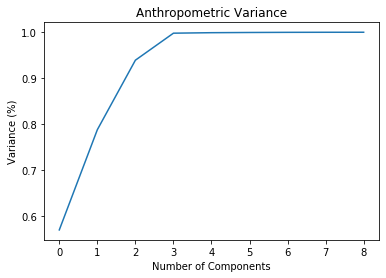

In [3]:
# anthropometric traits to PCA

body = [
'BMPWT', # Weight (kg)
'BMPHT', # Standing height (cm)
'BMPWAIST', # Waist circumference (cm)
'BMPWHR', # Waist to hip ratio
'HIP', # Hip circumference (cm)
'ABSI', # A Body Shape Index
'HI', # hip size related index
'PI', # Ponderal index
'WHtR', #  Waist to height ratio
]

df_body = df[body]

# normalize the indices 
from sklearn import preprocessing

min_max_scaler = preprocessing.MinMaxScaler()
df_body = pd.DataFrame(min_max_scaler.fit_transform(df_body), columns=df_body.columns)

pca = PCA().fit(df_body)

# Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Anthropometric Variance')
plt.show()

# 3 components

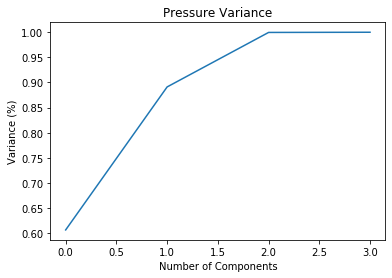

In [4]:
# Blood pressure traits to PCA

pressure = [
'PEPMNK5R', # Overall average K5, diastolic, BP
'PEPMNK1R', # - Overall average K1, systolic, BP
'PEP6DR', # Radial pulse rate
'MAP', # mean   
]

df_pressure = df[pressure]

# normalize the indices 
min_max_scaler = preprocessing.MinMaxScaler()
df_pressure = pd.DataFrame(min_max_scaler.fit_transform(df_pressure), columns=df_pressure.columns)

pca = PCA().fit(df_pressure)

# Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Pressure Variance')
plt.show()

# 2 components

In [5]:
# replace anthropometric and body pressure traits by PCA

pca=PCA(n_components=3) 
pca.fit(df_body)
df_body_pca=pca.transform(df_body) 
df = pd.concat([df, pd.DataFrame(data=df_body_pca, columns=['Body_PCA_1', 'Body_PCA_2', 'Body_PCA_3'])],  axis=1, sort=False).drop(columns=body)

pca=PCA(n_components=2) 
pca.fit(df_pressure)
df_pressure_pca=pca.transform(df_pressure) 
df = pd.concat([df, pd.DataFrame(data=df_pressure_pca, columns=['Pressure_PCA_1', 'Pressure_PCA_2'])],  axis=1, sort=False).drop(columns=pressure)

In [6]:
# data Splitting

target = 'HSAGEIR'

cols = list(df.columns.values) #Make a list of all of the columns in the df
cols.pop(cols.index(target)) #Remove b from list
dfy = df[cols+[target]] 
data = dfy.to_numpy()
np.random.shuffle(data)
X = data[:,:-1]
y = data[:,-1]

First, we show the keras mlp on the 34 attribute set of about 8000 rows.  

In [17]:
import tensorflow as tf
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, test_size=0.25,random_state=142)

std_scale = preprocessing.StandardScaler().fit(X_train)
X_train = std_scale.transform(X_train)

# Normalize Testing Data by using mean and SD of training set
X_test = std_scale.transform(X_test)


batch_size = 10000
buffer_size = 1000
num_epochs=1200

training_dataset = tf.data.Dataset.from_tensor_slices((X_train,y_train))
training_dataset = training_dataset.shuffle(buffer_size)
training_dataset = training_dataset.batch(batch_size)

testing_dataset = tf.data.Dataset.from_tensor_slices((X_test,y_test))
testing_dataset = testing_dataset.shuffle(buffer_size)
testing_dataset = testing_dataset.batch(batch_size)

#dataset = tf.data.Dataset.zip((X_train, y_train))

model = tf.keras.models.Sequential([
    #tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1),
                      #input_shape=[None]),
    tf.keras.layers.Dense(20, input_shape=[34], activation="relu"), 
    tf.keras.layers.Dense(20, activation="relu"), 
    #tf.keras.layers.Dropout(0.2),
    #tf.keras.layers.Dense(20, activation="relu"), 
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation="relu"),
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])

csvLogger = tf.keras.callbacks.CSVLogger("nhanes_net4.csv", separator=',', append=False)

model.compile(loss="mse", optimizer=tf.keras.optimizers.RMSprop(lr=1e-3), metrics=["mae"])

#model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(), metrics=["mae"])

history = model.fit(training_dataset,epochs=num_epochs,validation_data = testing_dataset, callbacks = [csvLogger],verbose = 1)
model.save('nhanes_model4.h5') 


Epoch 1/1200
1/1 [==============================] - 1s 524ms/step - loss: 2547.9036 - mean_absolute_error: 46.9465 - val_loss: 2550.2290 - val_mean_absolute_error: 46.8673
Epoch 2/1200
1/1 [==============================] - 0s 28ms/step - loss: 2544.4517 - mean_absolute_error: 46.9085 - val_loss: 2547.1790 - val_mean_absolute_error: 46.8332
Epoch 3/1200
1/1 [==============================] - 0s 29ms/step - loss: 2541.2349 - mean_absolute_error: 46.8731 - val_loss: 2544.0552 - val_mean_absolute_error: 46.7983
Epoch 4/1200
1/1 [==============================] - 0s 30ms/step - loss: 2537.9241 - mean_absolute_error: 46.8367 - val_loss: 2540.7939 - val_mean_absolute_error: 46.7618
Epoch 5/1200
1/1 [==============================] - 0s 33ms/step - loss: 2534.4980 - mean_absolute_error: 46.7988 - val_loss: 2537.3733 - val_mean_absolute_error: 46.7234
Epoch 6/1200
1/1 [==============================] - 0s 33ms/step - loss: 2530.9448 - mean_absolute_error: 46.7595 - val_loss: 2533.7622 - val_me

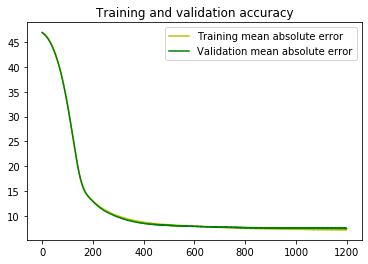

<Figure size 432x288 with 0 Axes>

In [18]:
import tensorflow as tf
import matplotlib.pyplot as plt

#model = tf.keras.models.load_model('nhanes_model.h5')
#history = model.history
mean_absolute_error = history.history['mean_absolute_error']
val_mean_absolute_error = history.history['val_mean_absolute_error']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, mean_absolute_error, 'y', label='Training mean absolute error')
plt.plot(epochs, val_mean_absolute_error, 'g', label='Validation mean absolute error')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

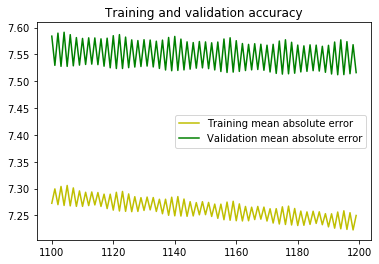

<Figure size 432x288 with 0 Axes>

In [19]:
import tensorflow as tf
import matplotlib.pyplot as plt

#model = tf.keras.models.load_model('nhanes_model.h5')
#history = model.history
mean_absolute_error2 = history.history['mean_absolute_error'][-100:]
val_mean_absolute_error2 = history.history['val_mean_absolute_error'][-100:]
loss2 = history.history['loss'][-100:]
val_loss2 = history.history['val_loss'][-100:]

epochs = range(len(loss))[-100:]

plt.plot(epochs, mean_absolute_error2, 'y', label='Training mean absolute error')
plt.plot(epochs, val_mean_absolute_error2, 'g', label='Validation mean absolute error')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

Next we show the tpot answer to the 25 attribute data of about 22000 rows

In [2]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LassoLarsCV
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from xgboost import XGBRegressor

# NOTE: Make sure that the class is labeled 'target' in the data file
filename = '_NHANES_TESTS_MERGED.csv'
tpot_data = pd.read_csv(filename, sep=',', dtype=np.float64)

target = 'Age at Screening Adjudicated Recode'
features = tpot_data.drop(target, axis=1).values
training_features, testing_features, training_target, testing_target = \
            train_test_split(features, tpot_data[target].values, random_state=None)

# Average CV score on the training set was:-112.16056199448535
exported_pipeline = make_pipeline(
    StackingEstimator(estimator=LassoLarsCV(normalize=True)),
    XGBRegressor(learning_rate=0.1, max_depth=10, min_child_weight=10, n_estimators=100, nthread=1, objective="reg:squarederror", subsample=0.6500000000000001)
)

exported_pipeline.fit(training_features, training_target)
results = exported_pipeline.predict(testing_features)

C:\ProgramData\Anaconda3\envs\denis\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)


The following are R^2 values

In [3]:
exported_pipeline.score(training_features, training_target)

0.9317367488802484

In [4]:
exported_pipeline.score(testing_features, testing_target)

0.7619151897509808

In [5]:
mae = np.mean(abs(results-testing_target))
mae

7.696927101980204

Now we show the keras net that was applied to the 34 attribute 8000 row data being applied to the 25 attribute 22000 row data

In [58]:
#! pip install --upgrade tfp-nightly
#! pip install tf_nightly
#! pip install tf_estimator_nightly


In [59]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function


import tensorflow as tf
print(tf.__version__)
import numpy as np

import tensorflow as tf
from tensorflow.python import tf2
if not tf2.enabled():
  import tensorflow.compat.v2 as tf
  tf.enable_v2_behavior()
  assert tf2.enabled()

import tensorflow_datasets as tfds
import tensorflow_probability as tfp


tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions

tf.__version__

1.14.0


'1.14.0'

In [60]:
if tf.test.gpu_device_name() != '/device:GPU:0':
  print('WARNING: GPU device not found.')
else:
  print('SUCCESS: Found GPU: {}'.format(tf.test.gpu_device_name()))

SUCCESS: Found GPU: /device:GPU:0


In [61]:

# NOTE: Make sure that the class is labeled 'target' in the data file
filename = '_NHANES_TESTS_MERGED.csv'
df = pd.read_csv(filename, sep=',', dtype=np.float64)


target = 'Age at Screening Adjudicated Recode'

cols = list(df.columns.values) #Make a list of all of the columns in the df
cols.pop(cols.index(target)) #Remove b from list
dfy = df[cols+[target]] 
data = dfy.to_numpy()
np.random.shuffle(data)
X = data[:,:-1]
y = data[:,-1]



In [62]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt 
from sklearn import preprocessing

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, test_size=0.25,random_state=142)

std_scale = preprocessing.StandardScaler().fit(X_train)
X_train = std_scale.transform(X_train)

# Normalize Testing Data by using mean and SD of training set
X_test = std_scale.transform(X_test)


batch_size = 100000
buffer_size = 1000
num_epochs=12000

training_dataset = tf.data.Dataset.from_tensor_slices((X_train,y_train))
training_dataset = training_dataset.shuffle(buffer_size)
training_dataset = training_dataset.batch(batch_size)

testing_dataset = tf.data.Dataset.from_tensor_slices((X_test,y_test))
testing_dataset = testing_dataset.shuffle(buffer_size)
testing_dataset = testing_dataset.batch(batch_size)
model = tf.keras.models.Sequential([
    #tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1),
                      #input_shape=[None]
    tf.keras.layers.Dense(20, input_shape=[25], activation="relu"), 
    tf.keras.layers.Dense(20, activation="relu"), 
    #tf.keras.layers.Dropout(0.2),
    #tf.keras.layers.Dense(20, activation="relu"), 
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation="relu"),
    #tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(1)
])

csvLogger = tf.keras.callbacks.CSVLogger("nhanes_more.csv", separator=',', append=False)

model.compile(loss="mse", optimizer=tf.keras.optimizers.RMSprop(lr=1e-3), metrics=["mae"])

#model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(), metrics=["mae"])

history = model.fit(training_dataset,epochs=num_epochs,validation_data = testing_dataset, callbacks = [csvLogger],verbose = 1)
model.save('nhanes_model_more.h5') 


Epoch 1/12000
1/1 [==============================] - 2s 2s/step - loss: 2161.1714 - mae: 41.2925 - val_loss: 2146.3555 - val_mae: 41.0496
Epoch 2/12000
1/1 [==============================] - 0s 76ms/step - loss: 2155.2041 - mae: 41.2248 - val_loss: 2142.5244 - val_mae: 41.0059
Epoch 3/12000
1/1 [==============================] - 0s 73ms/step - loss: 2151.3396 - mae: 41.1808 - val_loss: 2139.4736 - val_mae: 40.9709
Epoch 4/12000
1/1 [==============================] - 0s 78ms/step - loss: 2148.2598 - mae: 41.1457 - val_loss: 2136.8193 - val_mae: 40.9404
Epoch 5/12000
1/1 [==============================] - 0s 79ms/step - loss: 2145.5691 - mae: 41.1151 - val_loss: 2134.3926 - val_mae: 40.9126
Epoch 6/12000
1/1 [==============================] - 0s 83ms/step - loss: 2143.1047 - mae: 41.0870 - val_loss: 2132.1025 - val_mae: 40.8863
Epoch 7/12000
1/1 [==============================] - 0s 88ms/step - loss: 2140.7815 - mae: 41.0605 - val_loss: 2129.9082 - val_mae: 40.8610
Epoch 8/12000
1/1 [===

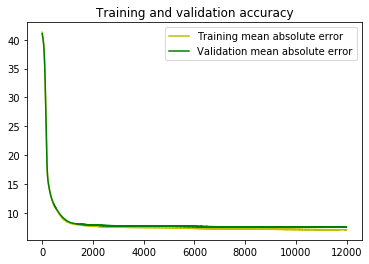

<Figure size 432x288 with 0 Axes>

In [63]:
import tensorflow as tf
import matplotlib.pyplot as plt

#model = tf.keras.models.load_model('nhanes_model.h5')
#history = model.history
mean_absolute_error = history.history['mae']
val_mean_absolute_error = history.history['val_mae']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(loss))

plt.plot(epochs, mean_absolute_error, 'y', label='Training mean absolute error')
plt.plot(epochs, val_mean_absolute_error, 'g', label='Validation mean absolute error')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

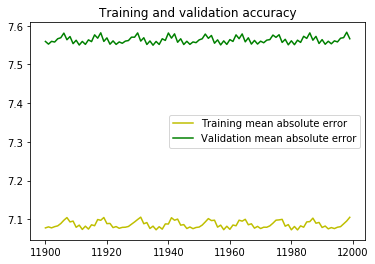

<Figure size 432x288 with 0 Axes>

In [64]:
import tensorflow as tf
import matplotlib.pyplot as plt

#model = tf.keras.models.load_model('nhanes_model.h5')
#history = model.history
mean_absolute_error2 = history.history['mae'][-100:]
val_mean_absolute_error2 = history.history['val_mae'][-100:]
loss2 = history.history['loss'][-100:]
val_loss2 = history.history['val_loss'][-100:]

epochs = range(len(loss))[-100:]

plt.plot(epochs, mean_absolute_error2, 'y', label='Training mean absolute error')
plt.plot(epochs, val_mean_absolute_error2, 'g', label='Validation mean absolute error')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

Here we used a new dataset of 25 attributes but with an n of 22,000.  We have done slightly better than the tpot baseline, with an mae of about 7.55 vs 7.69.  We orginally tried 34 attributes on an n of about 8000 then 25 attributes on an n of about 22,000, and have roughly the same results, if slightly worse in tpot.  Now we try different strategies of incomplete data.  First we will try Variational Autoencoder on the two clean sets for a baseline, then on data with many NAs, then on overlapping types of data with NAs.  This notebook now contains the first clean set.

In [5]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

#! pip install --upgrade tfp-nightly
#! pip install tf_nightly-gpu
#! pip install tf_estimator_nightly

import tensorflow as tf
from tensorflow.python import tf2
if not tf2.enabled():
  import tensorflow.compat.v2 as tf
  tf.enable_v2_behavior()
  assert tf2.enabled()

#import tensorflow_datasets as tfds
import tensorflow_probability as tfp


tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions
K = tfk.backend

print(tf.__version__)

if tf.test.gpu_device_name() != '/device:GPU:0':
  print('WARNING: GPU device not found.')
else:
  print('SUCCESS: Found GPU: {}'.format(tf.test.gpu_device_name()))

import numpy as np
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import RobustScaler
import matplotlib.pyplot as plt 
from scipy import stats
from scipy.stats import mstats
from sklearn import preprocessing
from sklearn.model_selection import train_test_split


K.clear_session()

2.0.0-dev20190928


In [6]:
tf.test.gpu_device_name()

''

In [7]:

# NOTE: Make sure that the class is labeled 'target' in the data file
filename = '_NHANES_TESTS_MERGED.csv'
df = pd.read_csv(filename, sep=',', dtype=np.float64)


target = 'Age at Screening Adjudicated Recode'

cols = list(df.columns.values) #Make a list of all of the columns in the df
cols.pop(cols.index(target)) #Remove b from list
dfy = df[cols+[target]] 
data = dfy.to_numpy()
np.random.shuffle(data)

X_train = data[:-5000,:]
X_test = data[-5000:,:]

std_scale = preprocessing.RobustScaler().fit(X_train)
X_train = std_scale.transform(X_train)
y_train = X_train

# Normalize Testing Data by using mean and SD of training set
X_test = std_scale.transform(X_test)
y_test = X_test

In [8]:
print (len(X_train))
X_train[0]

25104


array([ 0.        ,  0.        , -0.25      , -0.42424242, -0.375     ,
        0.5       , -0.24559023,  1.44827586, -1.        , -0.4375    ,
        0.29508197, -0.57894737, -0.72      , -0.59375   , -0.13253012,
        0.5       ,  0.57142857,  0.5       ,  0.52054795,  0.8       ,
       -0.16666667, -0.74387947, -0.1302521 ,  0.44609665,  0.5       ,
       -0.46153846])

In [9]:
print (len(y_test))
y_test[0]

5000


array([ 0.125     ,  0.41666667,  0.25      , -0.12121212,  0.        ,
        0.33333333,  1.43894166,  0.34482759, -1.        , -0.3125    ,
        1.27868852, -0.64912281, -0.72      , -0.296875  , -0.22891566,
        0.        ,  1.38571429, -0.2       ,  0.20547945,  0.        ,
        0.33333333, -0.10546139,  0.49159664,  0.60223048, -0.46153846,
       -0.17948718])

In [10]:

latent_dim = 5
intermediary_dims =[20,10,latent_dim]
original_dim =26
batch_size= 128  
num_epochs=1000

beta1 =[0.0,0.0,0.0,0.0,0.0,0.2,0.4,0.6,0.8,1.0,1.0,1.0,1.0,1.0,1.0,
        1.0,1.2,1.4,1.6,1.8,2.0,2.2,2.4,2.6,2.8,3.0,3.2,3.4,3.6,3.8,
        4.0,4.2,4.4,4.6,4.8,5.0,5.2,5.4,5.6,5.8,6.0,6.2,6.4,6.6,6.8]
beta2 =[0.0,0.0,0.0,0.0,0.2,0.4,0.6,0.8,1.0,1.0,1.0,1.0,1.0,1.0,1.0,
        1.2,1.4,1.6,1.8,2.0,2.2,2.4,2.6,2.8,3.0,3.2,3.4,3.6,3.8,4.0,
        4.2,4.4,4.6,4.8,5.0,5.2,5.4,5.6,5.8,6.0,6.2,6.4,6.6,6.8,7.0]

cycle_num=0

beta = K.variable(value=beta1[0])

prior2 = tfd.Independent(tfd.Normal(loc=tf.zeros(latent_dim), scale=tf.ones(latent_dim)),
                        reinterpreted_batch_ndims=1)
activity_regularizer2 = tfpl.KLDivergenceRegularizer(prior2, weight=beta) #increase weight for beta vae

In [11]:
def dense_layers(sizes):
    layers =[]
    for size in sizes:
        layers.append(tfkl.Dense(size))
        layers.append(tfkl.BatchNormalization())
        layers.append(tfkl.Activation(tf.nn.leaky_relu))
        #layers.append(tfkl.Dropout(0.5))
    return tfk.Sequential(layers)
    #return tfk.Sequential([tfkl.Dense(size, activation=tf.nn.leaky_relu),tfkl.normalization.BatchNormalization() for size in sizes])

In [12]:

encoder2 = tfk.Sequential([
    #tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1),
        #input_shape=[None]),
    tfkl.InputLayer(input_shape=[original_dim], name='encoder2_input'),
    #tfkl.Dropout(0.5),
    dense_layers(intermediary_dims),
    tfkl.Dense(tfpl.MultivariateNormalTriL.params_size(latent_dim), activation=None),
    tfpl.MultivariateNormalTriL(latent_dim,activity_regularizer=activity_regularizer2)
], name='encoder2')

encoder2.summary()
#plot_model(encoder, to_file='vae_mlp_encoder.png', show_shapes=True)

Instructions for updating:
Do not pass `graph_parents`.  They will  no longer be used.
Model: "encoder2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 5)                 945       
_________________________________________________________________
dense_3 (Dense)              (None, 20)                120       
_________________________________________________________________
multivariate_normal_tri_l (M ((None, 5), (None, 5))    0         
Total params: 1,065
Trainable params: 995
Non-trainable params: 70
_________________________________________________________________


In [13]:
decoder2 = tfk.Sequential([
    tfkl.InputLayer(input_shape=[latent_dim]),
    #tfkl.Dropout(0.5),
    dense_layers(reversed(intermediary_dims)),
    tfkl.Dense(tfpl.IndependentNormal.params_size(original_dim), activation=None),
    tfpl.IndependentNormal(original_dim),
], name='decoder2')

decoder2.summary()

Model: "decoder2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 20)                450       
_________________________________________________________________
dense_7 (Dense)              (None, 52)                1092      
_________________________________________________________________
independent_normal (Independ ((None, 26), (None, 26))  0         
Total params: 1,542
Trainable params: 1,472
Non-trainable params: 70
_________________________________________________________________


In [14]:
vae2 = tfk.Model(inputs=encoder2.inputs,
                #outputs=decoder2(encoder2.outputs[0]),
                outputs=decoder2(encoder2.outputs),
                name='vae_mlp2')

vae2.summary()
negloglik = lambda x, rv_x: -rv_x.log_prob(x)

vae2.compile(optimizer=tf.keras.optimizers.Nadam(), 
            loss=negloglik, metrics =['mae'])

Model: "vae_mlp2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
encoder2_input (InputLayer)  [(None, 26)]              0         
_________________________________________________________________
sequential (Sequential)      (None, 5)                 945       
_________________________________________________________________
dense_3 (Dense)              (None, 20)                120       
_________________________________________________________________
multivariate_normal_tri_l (M ((None, 5), (None, 5))    0         
_________________________________________________________________
decoder2 (Sequential)        (None, 26)                1542      
Total params: 2,607
Trainable params: 2,467
Non-trainable params: 140
_________________________________________________________________


In [15]:
class warmupCallback(tf.keras.callbacks.Callback):

  def on_epoch_end(self, epoch, logs=None):
    #linearly set beta from beta1 and beta2
    
    temp_change_each_epoch = (beta2[cycle_num]-beta1[cycle_num])/((len(beta2)*num_epochs)*1.)
    temperature_now = ((num_epochs*cycle_num) +epoch)*temp_change_each_epoch
    K.set_value(beta, temperature_now)
    

To simply load pre-existing weights,set load_weights to True, and learn to False, and make sure the name of the weights to load is correct.  To Pretrain on weights, set load_weights to True and learn to True.  To train from scratch, set load_weights to false and learn to true.


In [16]:
#vae2.fit(train_dataset,
#        epochs=10000,
#        validation_data=eval_dataset)
load_weights = True
learn = False
history = None
if load_weights:
    vae2.load_weights('vae_bn_wu19.5.h5')
if learn:
    for i in range(len(beta1)):
        cycle_num =i
        print("Cycle {0}".format(cycle_num))
        history = vae2.fit(X_train, y_train,
                    epochs=num_epochs,
                    batch_size=batch_size,
                    validation_data=(X_test, y_test),
                    callbacks =[warmupCallback()]
            )
        vae2.save_weights('vae_bn_wu22.{0}.h5'.format(i))

In [17]:
if hasattr(vae2, 'history'):
    loss = vae2.history.history['loss']
    val_loss = vae2.history.history['val_loss']

    epochs = range(len(loss))

    plt.plot(epochs, loss, 'y', label='Training negative log liklihood')
    plt.plot(epochs, val_loss, 'g', label='Validation negative log likelihood')
    plt.title('Training and validation')
    plt.legend(loc=0)
    plt.figure()


    plt.show()

Below we see that a very close result is returned in the testing set when you put the same patient age marker vector through. The 25 attributes get compressed into a code 5 long, and then decompressed back.Age is generaally within 5 years.

In [18]:
results = vae2.predict(X_test)

In [19]:
std_scale.inverse_transform(X_test) 

array([[ 74. ,  25. ,   4.4, ...,  90.9,   5.7,  32. ],
       [ 56. ,  21. ,   4.3, ...,  98.7,   6.9,  69. ],
       [ 92. ,  16. ,   4.6, ...,  46.7,   8.3,  17. ],
       ...,
       [ 72. ,  13. ,   4.2, ..., 102.1,   3.8,  22. ],
       [ 84. ,  32. ,   4. , ..., 114.8,   4.9,  47. ],
       [ 72. ,  24. ,   4.3, ..., 127.1,   7.1,  37. ]])

In [20]:
std_scale.inverse_transform(results) 

array([[ 62.518066 ,  23.762293 ,   4.496845 , ...,  51.373768 ,
          1.4855746,  31.448414 ],
       [ 76.1221   ,  23.852919 ,   4.315416 , ...,  78.89513  ,
          4.4182014,  66.59033  ],
       [ 66.969505 ,  21.327377 ,   4.4600406, ...,  91.41645  ,
          9.15008  ,  17.205109 ],
       ...,
       [ 72.073044 ,  14.992007 ,   3.953332 , ...,  68.99749  ,
          6.784744 ,  22.512493 ],
       [ 70.149734 ,  33.10184  ,   4.1448164, ..., 152.73439  ,
         12.739002 ,  45.53817  ],
       [ 74.74354  ,  27.034512 ,   4.2376976, ...,  79.28335  ,
          7.4004774,  35.824352 ]], dtype=float32)

In [21]:
true_ages = std_scale.inverse_transform(X_test) [:,-1:]
true_ages

array([[32.],
       [69.],
       [17.],
       ...,
       [22.],
       [47.],
       [37.]])

In [22]:
predicted_ages = std_scale.inverse_transform(results) [:,-1:]
predicted_ages

array([[31.448414],
       [66.59033 ],
       [17.205109],
       ...,
       [22.512493],
       [45.53817 ],
       [35.824352]], dtype=float32)

In [23]:
mae = np.mean(abs(true_ages-predicted_ages))
mae

2.8015386669158935

Illustrate in tsne by first sending the test set through the encoder network to get the tensor of means part of the encoding for each instance. Next, express in 2 dimensions, and color smoothly according to age. Gender groups the clearest in tsne, with Men on the left and women on the right.  Age is the clearest second dimension with old age at the bottom an youth at the top.Other things to note include liver enzymes, weight, and height.

In [24]:
b =X_test[0].reshape((1,26))
b

array([[ 0.125     ,  0.41666667,  0.25      , -0.12121212,  0.        ,
         0.33333333,  1.43894166,  0.34482759, -1.        , -0.3125    ,
         1.27868852, -0.64912281, -0.72      , -0.296875  , -0.22891566,
         0.        ,  1.38571429, -0.2       ,  0.20547945,  0.        ,
         0.33333333, -0.10546139,  0.49159664,  0.60223048, -0.46153846,
        -0.17948718]])

In [25]:
result1 = vae2.predict(b)

In [26]:
result1

array([[-0.48719925,  0.37428963,  0.29607922,  0.12217519,  0.23990503,
         0.30529347,  1.0184809 ,  0.37906453, -0.997489  ,  1.7450169 ,
         0.8298094 ,  0.17871207, -0.2998721 , -0.47395626,  0.27290013,
         0.20173728,  1.2915487 , -0.713465  ,  0.19388932, -0.77047914,
        -1.0168205 ,  0.58460295,  0.20224833, -0.20778319, -0.20816058,
        -0.18323842]], dtype=float32)

In [27]:
std_scale.inverse_transform(b)

array([[ 74.   ,  25.   ,   4.4  ,  66.   ,  23.   ,  14.   ,   6.905,
          0.9  ,   1.   ,  85.   ,  49.3  ,  23.1  ,  28.7  ,  87.4  ,
        233.   ,   3.   ,   5.64 ,  12.3  , 169.7  ,   2.375,  74.   ,
          1.073, 105.3  ,  90.9  ,   5.7  ,  32.   ]])

In [28]:
std_scale.inverse_transform(result1)

array([[ 64.20481   ,  24.491476  ,   4.4184318 ,  74.031784  ,
         24.91924   ,  13.83176   ,   6.2852407 ,   0.90992874,
          1.002511  , 117.92027   ,  46.561836  ,  32.53732   ,
         29.75032   ,  86.26668   , 274.6507    ,   3.4034746 ,
          5.5740843 ,  11.786535  , 169.53078   ,   2.27869   ,
         65.89908   ,   1.8058484 ,  98.41351   ,  69.110634  ,
          6.3587823 ,  31.853703  ]], dtype=float32)

In [29]:
#deterministic mean codes. labels are in true_ages
code = encoder2(X_test)
print (true_ages.shape)
code.loc


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

(5000, 1)


<tf.Tensor: shape=(5000, 5), dtype=float32, numpy=
array([[-0.6579833 , -0.41289002, -0.41750288,  0.00814426,  0.29492164],
       [-1.4412922 , -0.12221044,  0.12697244, -0.0816873 , -0.75259304],
       [ 0.67810106,  0.21285987,  0.78691006, -0.00355613,  0.8258883 ],
       ...,
       [ 0.82066965,  0.42998892,  1.4864618 , -0.04640356,  0.25840425],
       [ 1.1189725 , -0.80012375, -0.69514656,  0.15979555,  0.14124787],
       [-1.0239441 , -0.608095  ,  0.77082884, -0.01295841, -0.1433587 ]],
      dtype=float32)>

In [30]:
#deterministic mean codes, as expecte values for predictions, rather than use a random variate
expected = decoder2(code.loc)
expected_results=expected.mean()
expected_results

<tf.Tensor: shape=(5000, 26), dtype=float32, numpy=
array([[-0.04096243,  0.4523235 ,  0.2697066 , ...,  0.2087704 ,
         0.22098643, -0.17685181],
       [-0.319643  ,  0.18772523,  0.01557481, ...,  0.589622  ,
        -0.20269048,  0.758831  ],
       [ 0.3050358 , -0.22648641,  0.3676721 , ..., -0.3454913 ,
         0.29589766, -0.57177913],
       ...,
       [ 0.15664488, -0.29171112,  0.03692687, ..., -0.36036885,
         0.07835168, -0.42745495],
       [ 0.24757665,  0.779454  , -0.23296249, ...,  0.20852697,
         0.25565994,  0.22611487],
       [-0.11054781,  0.45858717,  0.30122936, ...,  0.29452276,
         0.09092116, -0.04564118]], dtype=float32)>

In [31]:
expected_ages = std_scale.inverse_transform(expected_results) [:,-1:]
expected_ages

array([[32.10277945],
       [68.59440994],
       [16.70061386],
       ...,
       [22.32925701],
       [47.8184799 ],
       [37.21999383]])

In [32]:
mae = np.mean(abs(true_ages-expected_ages))
mae

1.5309521181464196

In [33]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
%matplotlib inline

vecs =[]
ages=[]
for vec,age in zip(code.loc, true_ages):
    vecs.append(vec)
    ages.append(age)
    
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
new_values = tsne_model.fit_transform(vecs)


In [34]:
new_values[0]

array([-13.956818,  30.292059], dtype=float32)

In [35]:
true_ages[0]

array([32.])

In [36]:
maxi = max(ages)
mini = min(ages)
rangei = (maxi-mini)*1.
normalized_ages = [(age-mini)/rangei for age in ages]

In [37]:
mini

array([12.])

In [38]:
maxi

array([85.])

In [39]:

color = [str(nage[0]) for nage in normalized_ages]

Age at Screening Adjudicated Recode


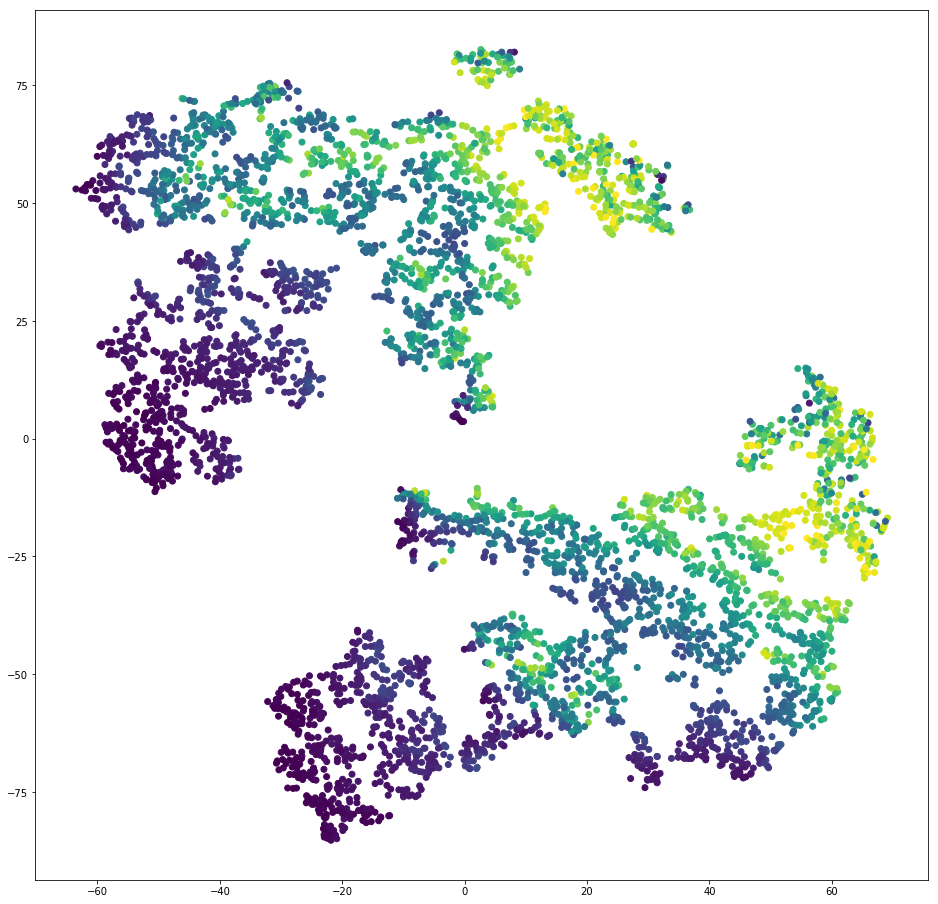

In [40]:
from matplotlib import cm

x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])

plt.figure(figsize=(16, 16)) 
plt.scatter(x,y,c=color)
print('Age at Screening Adjudicated Recode')
plt.show()

In [41]:
cols

['60 sec. pulse (30 sec. pulse * 2)',
 'Alanine aminotransferase ALT (U/L)',
 'Albumin (g/dL)',
 'Alkaline phosphotase (U/L)',
 'Aspartate aminotransferase AST (U/L)',
 'Blood urea nitrogen (mg/dL)',
 'Cholesterol (mmol/L)',
 'Creatinine (mg/dL)',
 'Gender',
 'Glucose serum (mg/dL)',
 'Hematocrit (%)',
 'Lymphocyte percent (%)',
 'Mean cell hemoglobin (pg)',
 'Mean cell volume (fL)',
 'Platelet count SI (1000 cells/uL)',
 'Race Ethnicity Recode',
 'Red blood cell count (million cells/uL)',
 'Red cell distribution width (%)',
 'Standing Height (cm)',
 'Total calcium (mmol/L)',
 'Total protein (g/L)',
 'Triglycerides (mmol/L)',
 'Waist Circumference (cm)',
 'Weight (kg)',
 'White blood cell count (1000 cells/uL)']

60 sec. pulse (30 sec. pulse * 2)


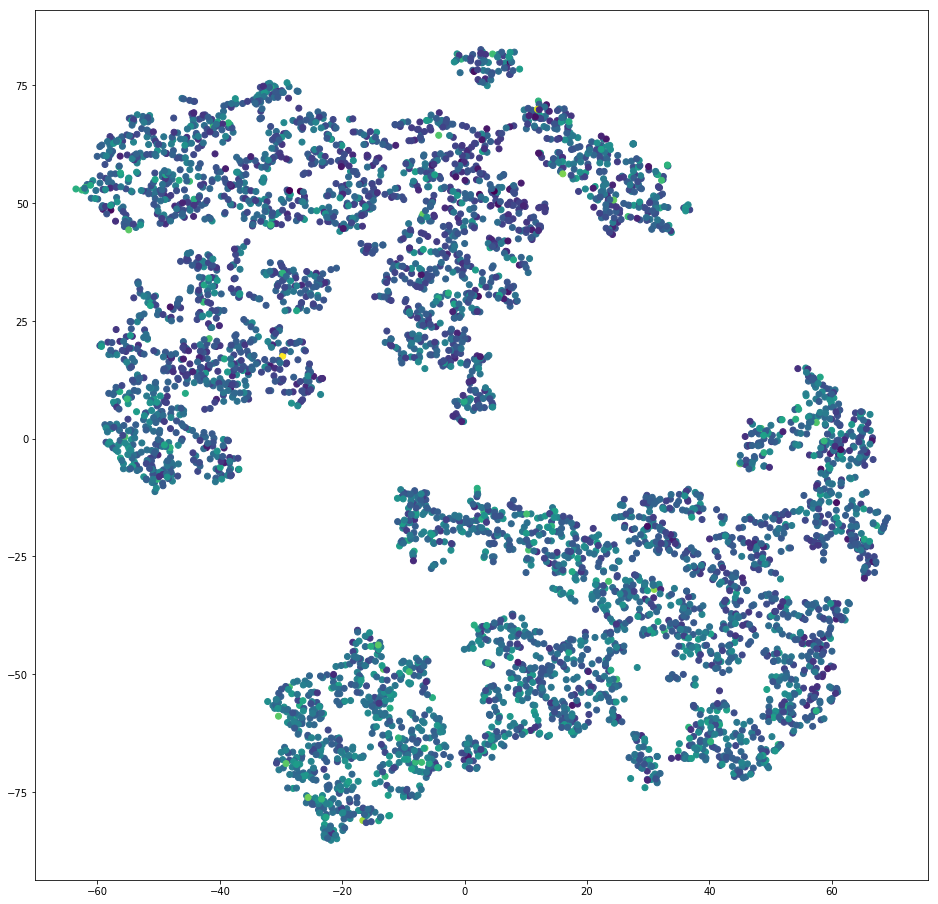

Alanine aminotransferase ALT (U/L)


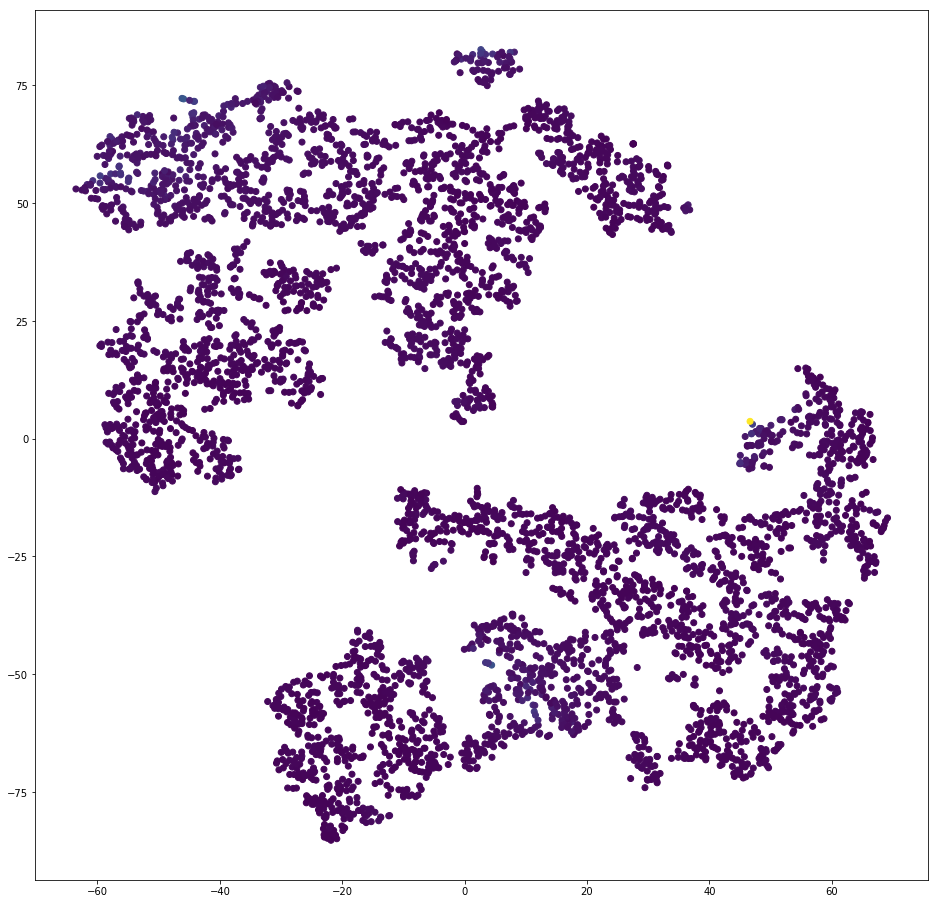

Albumin (g/dL)


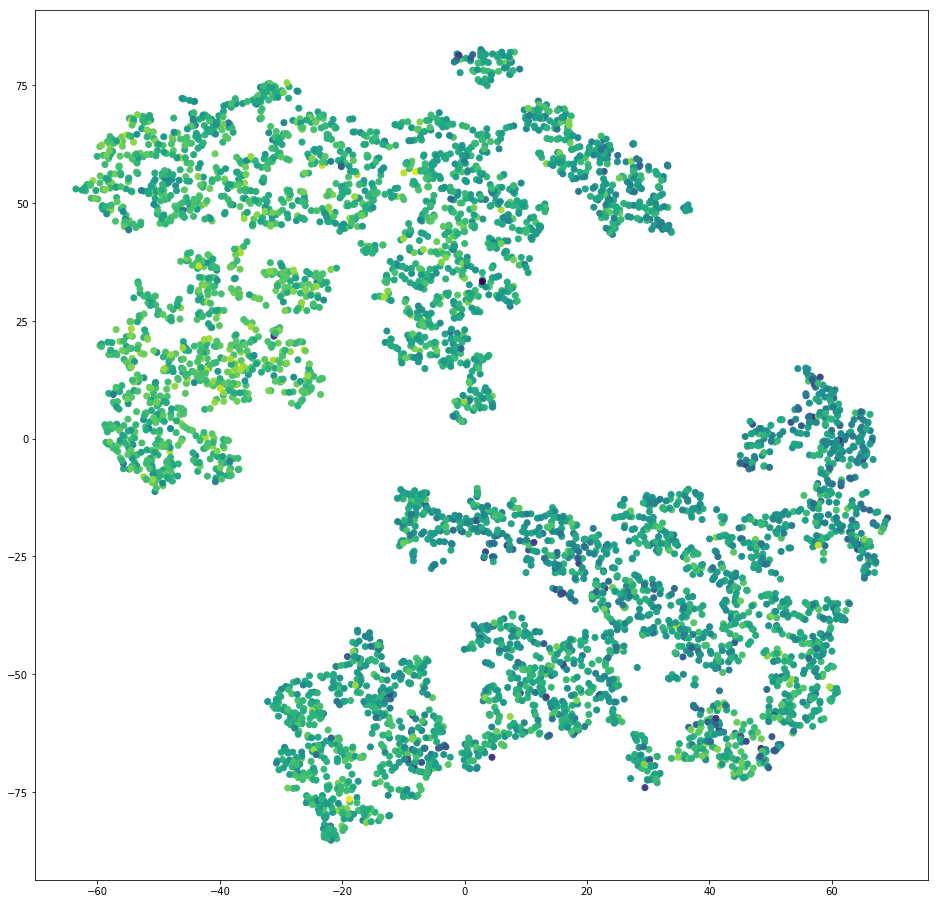

Alkaline phosphotase (U/L)


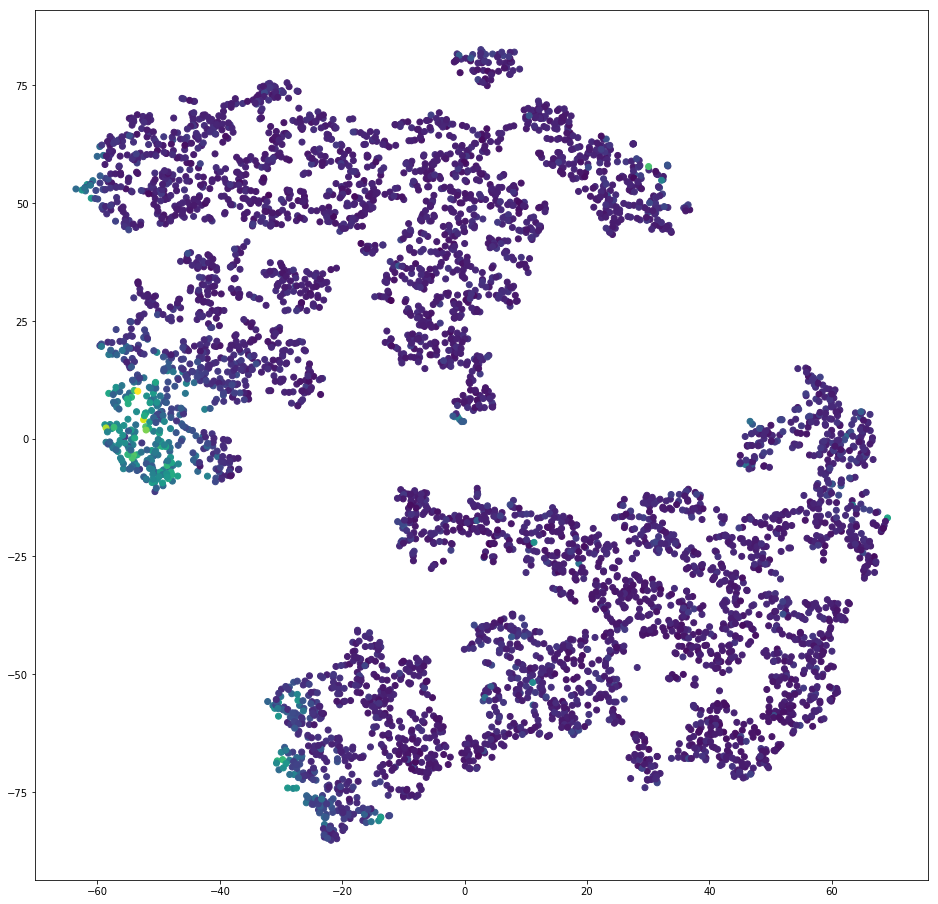

Aspartate aminotransferase AST (U/L)


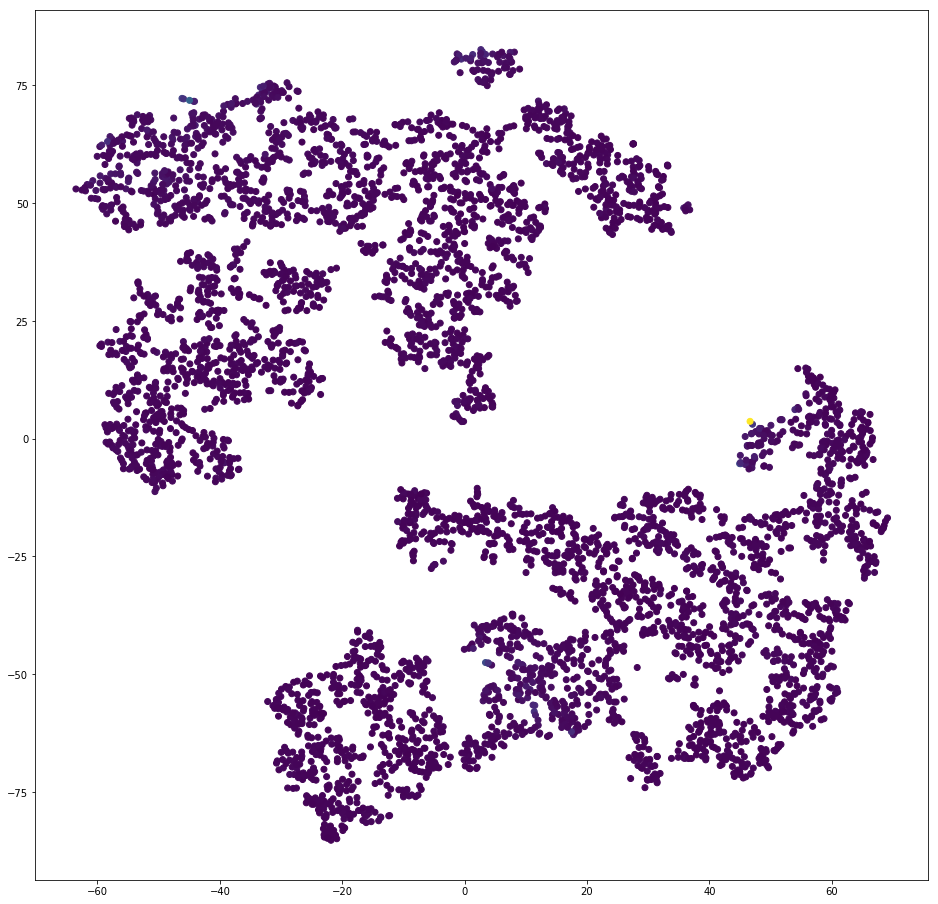

Blood urea nitrogen (mg/dL)


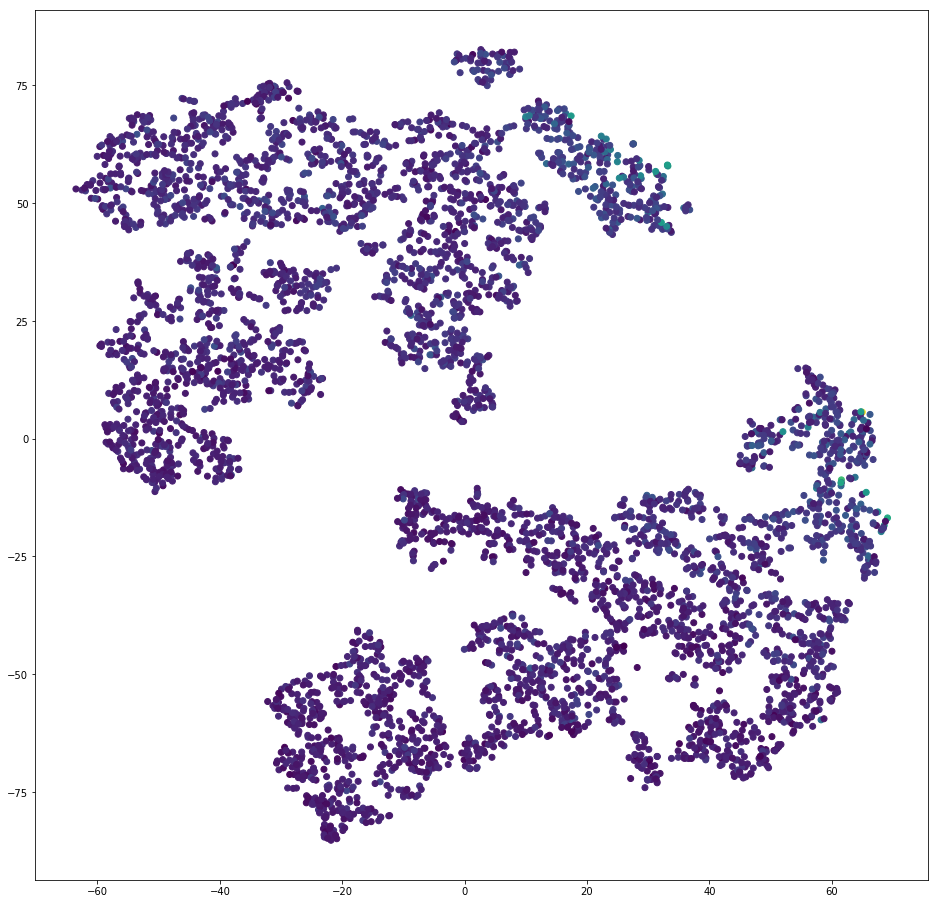

Cholesterol (mmol/L)


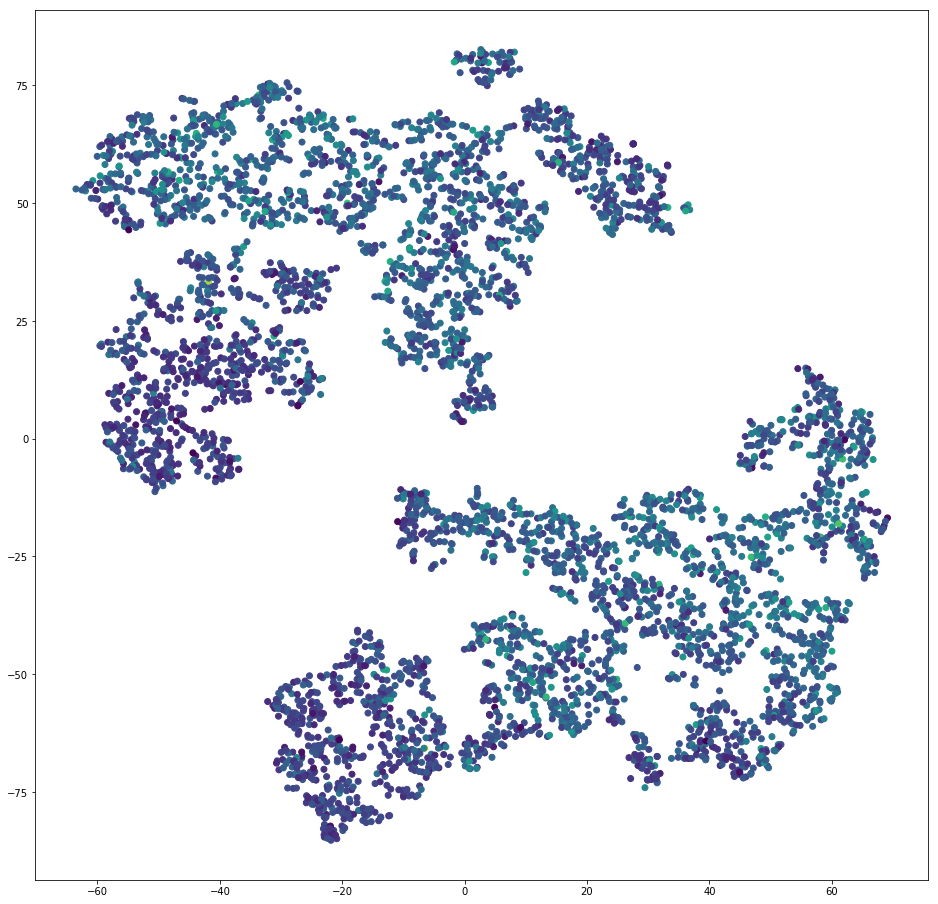

Creatinine (mg/dL)


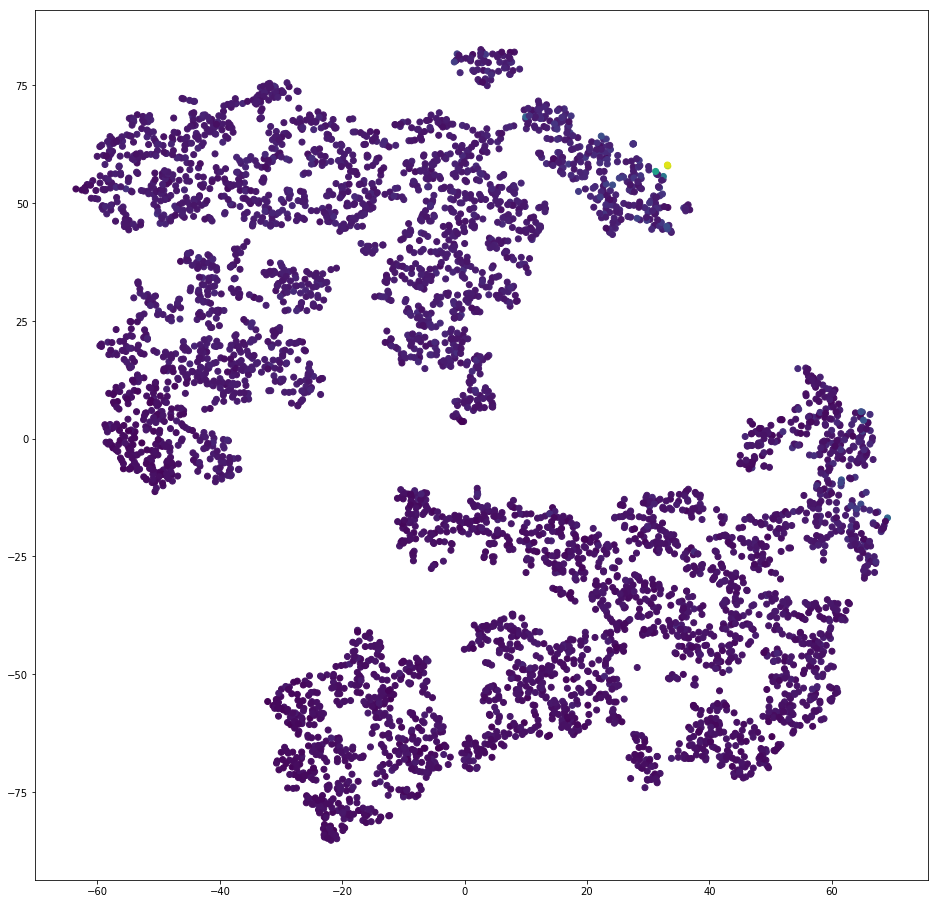

Gender


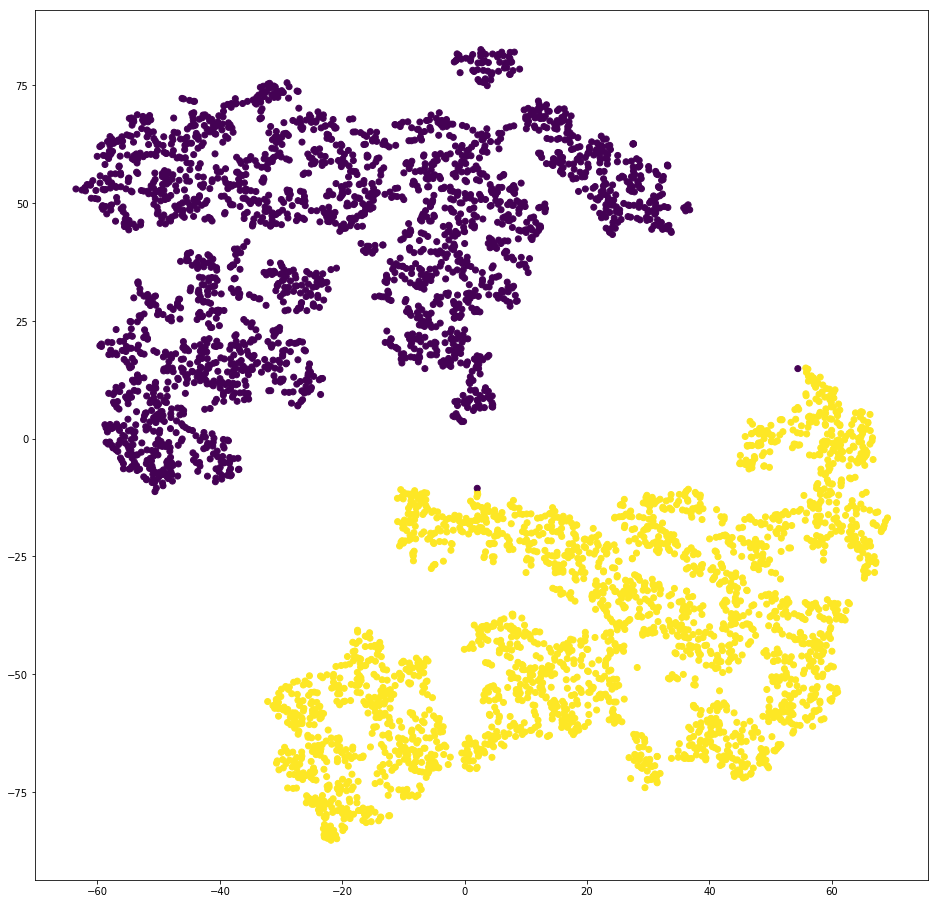

Glucose serum (mg/dL)


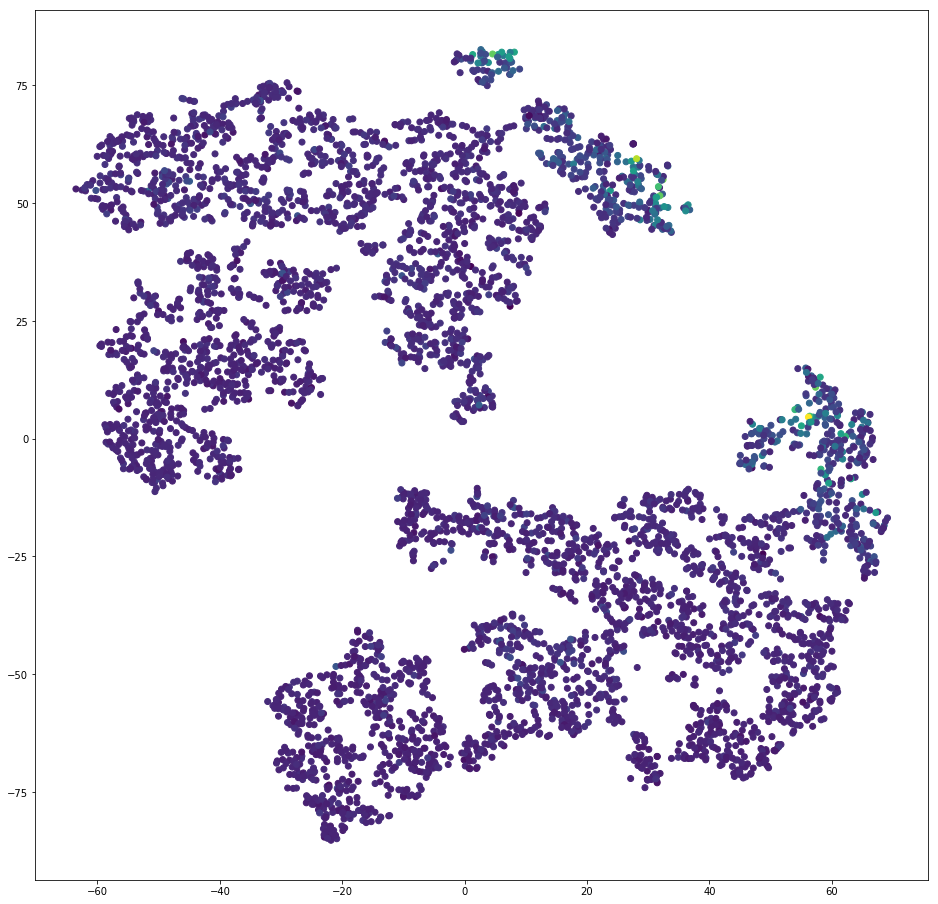

Hematocrit (%)


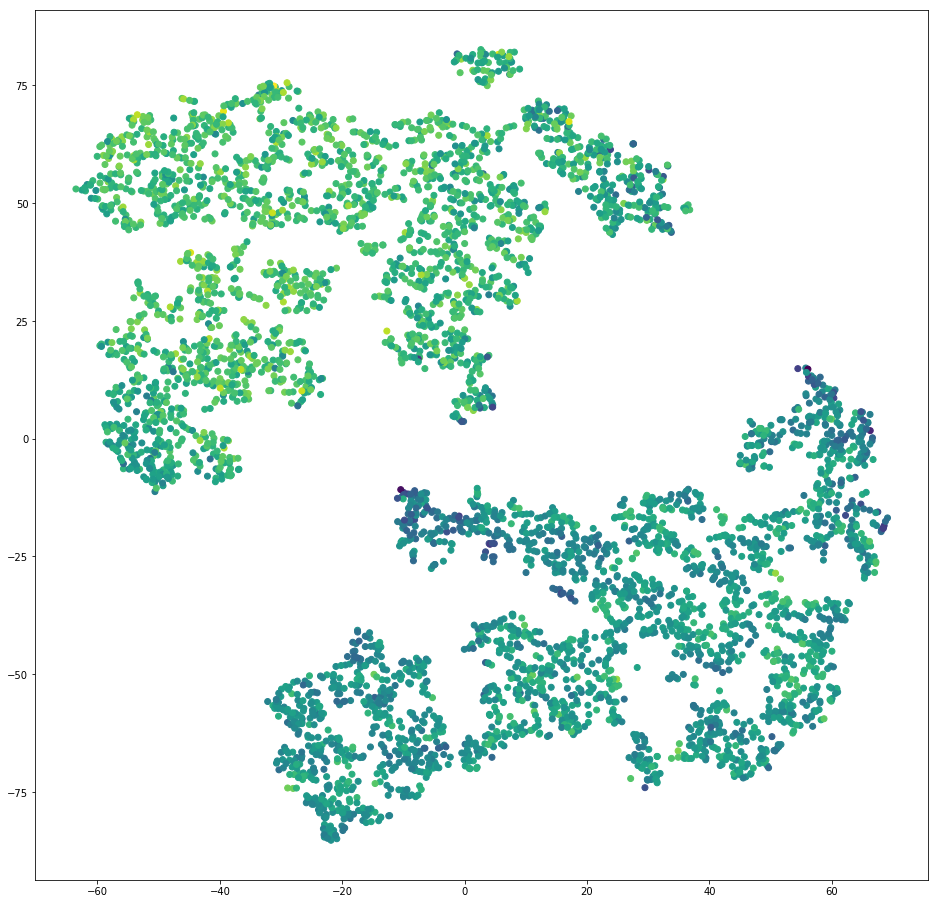

Lymphocyte percent (%)


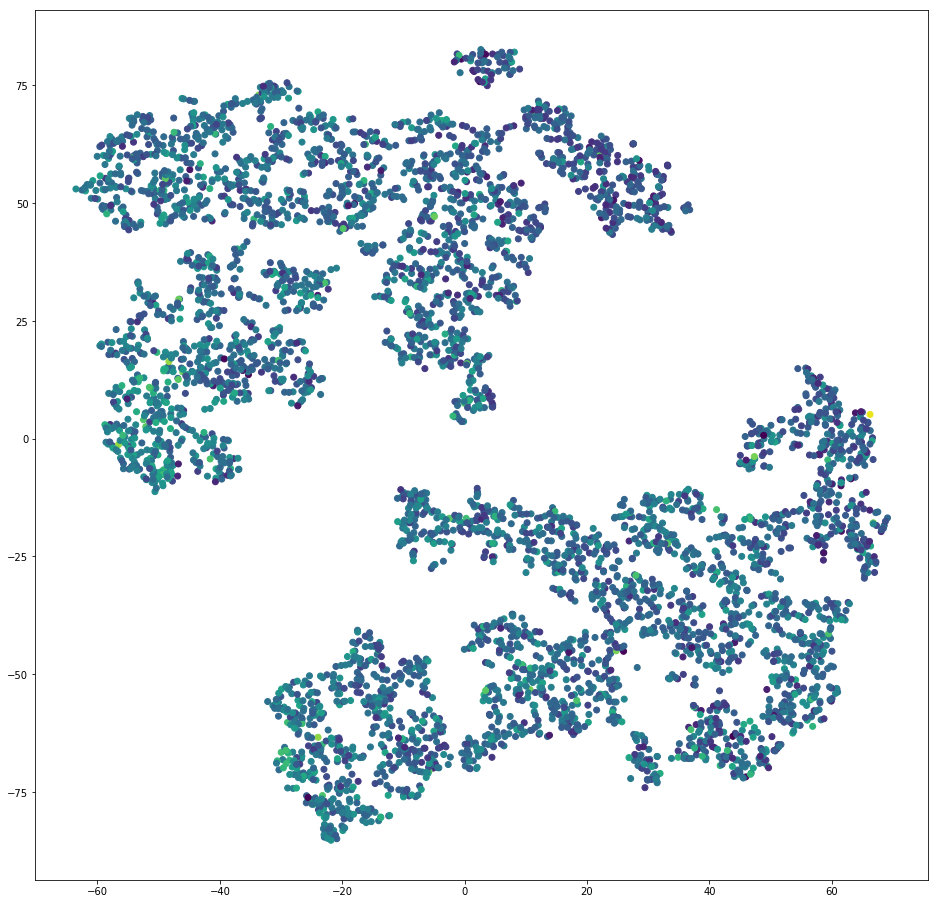

Mean cell hemoglobin (pg)


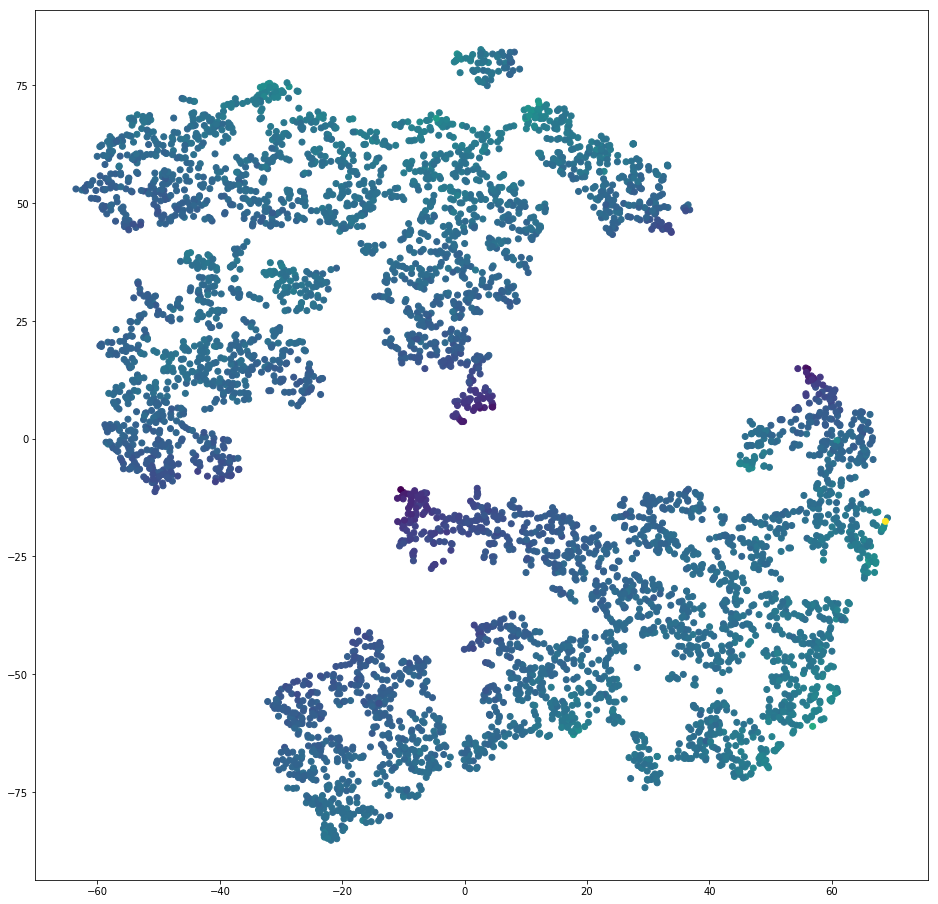

Mean cell volume (fL)


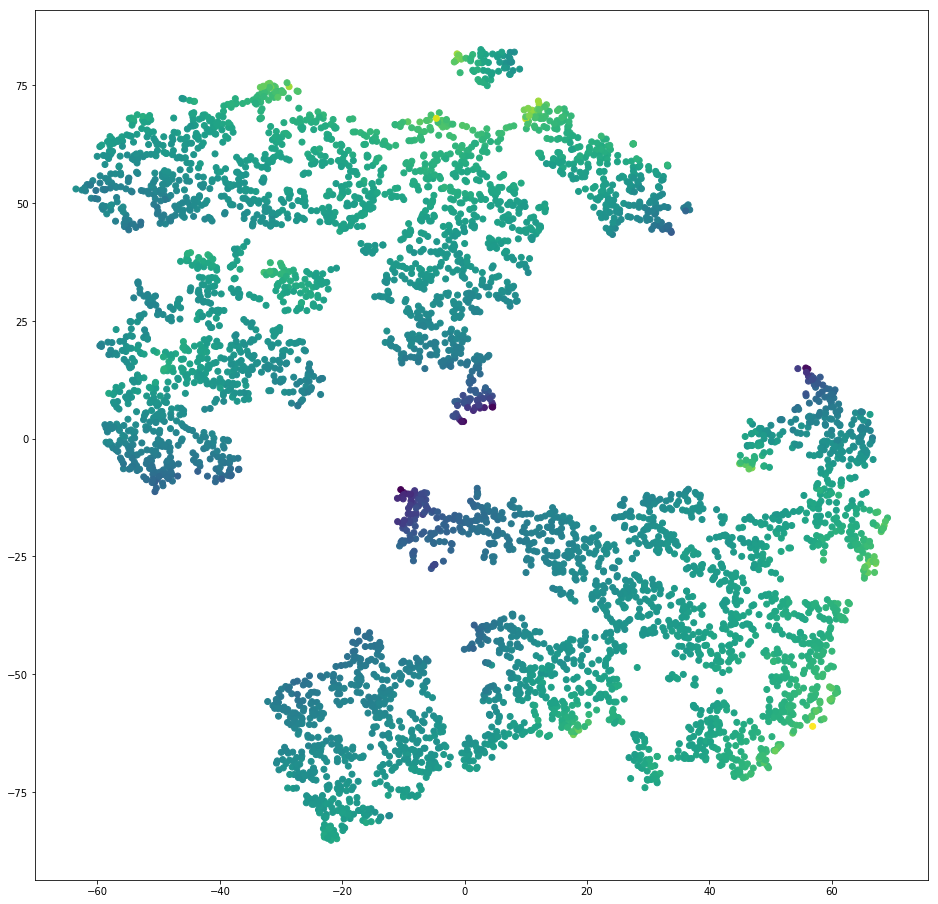

Platelet count SI (1000 cells/uL)


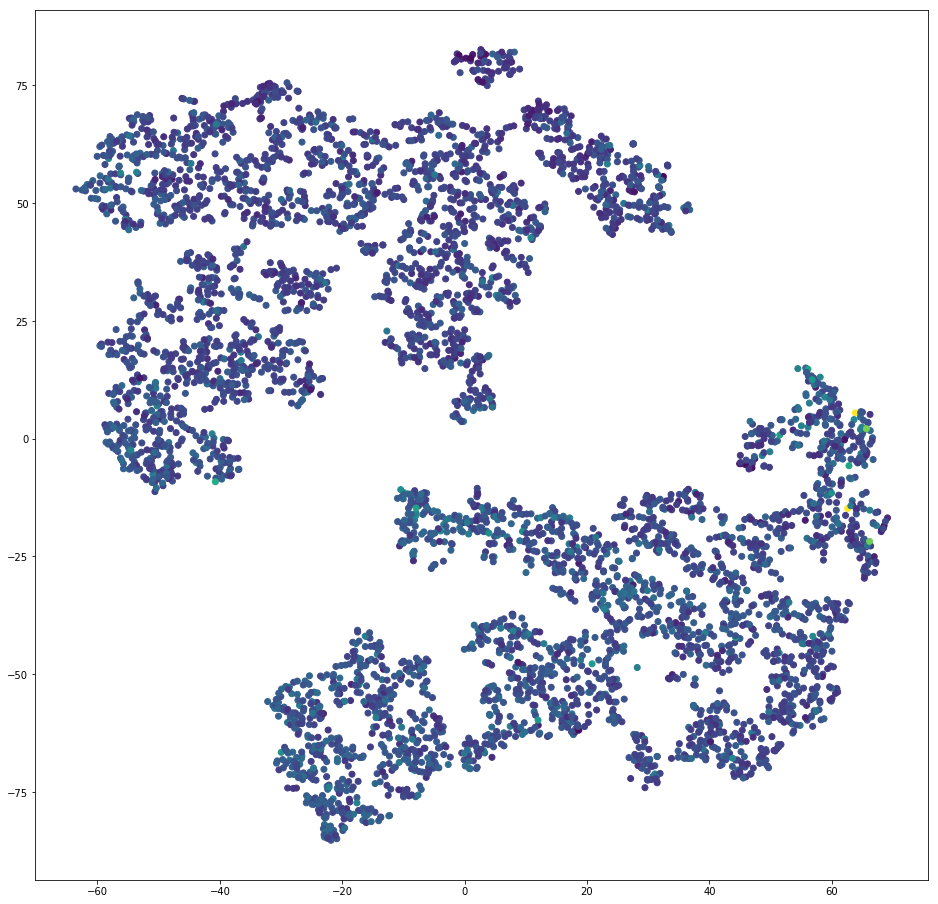

Race Ethnicity Recode


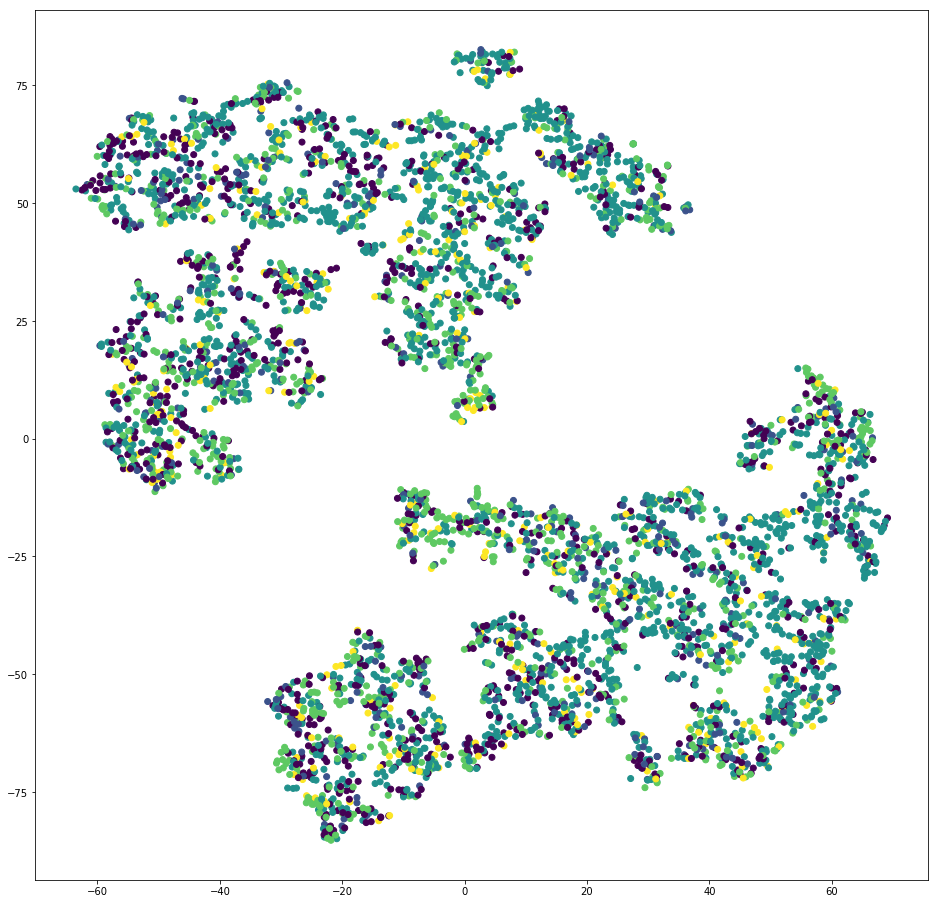

Red blood cell count (million cells/uL)


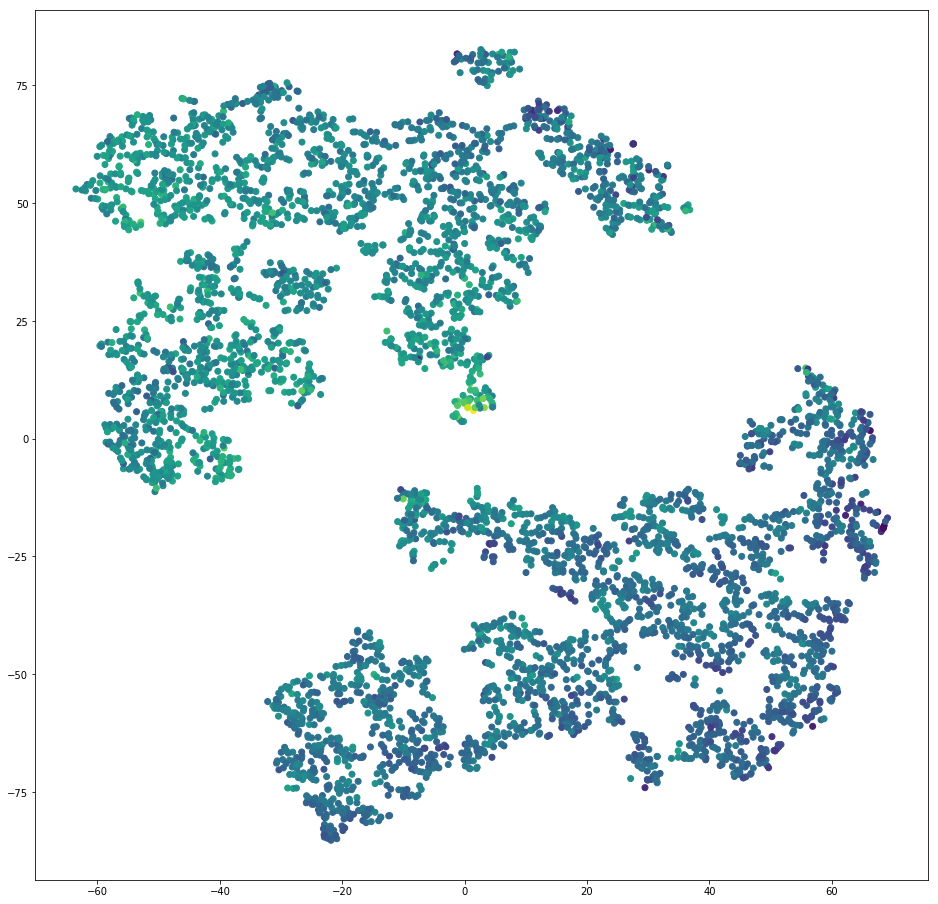

Red cell distribution width (%)


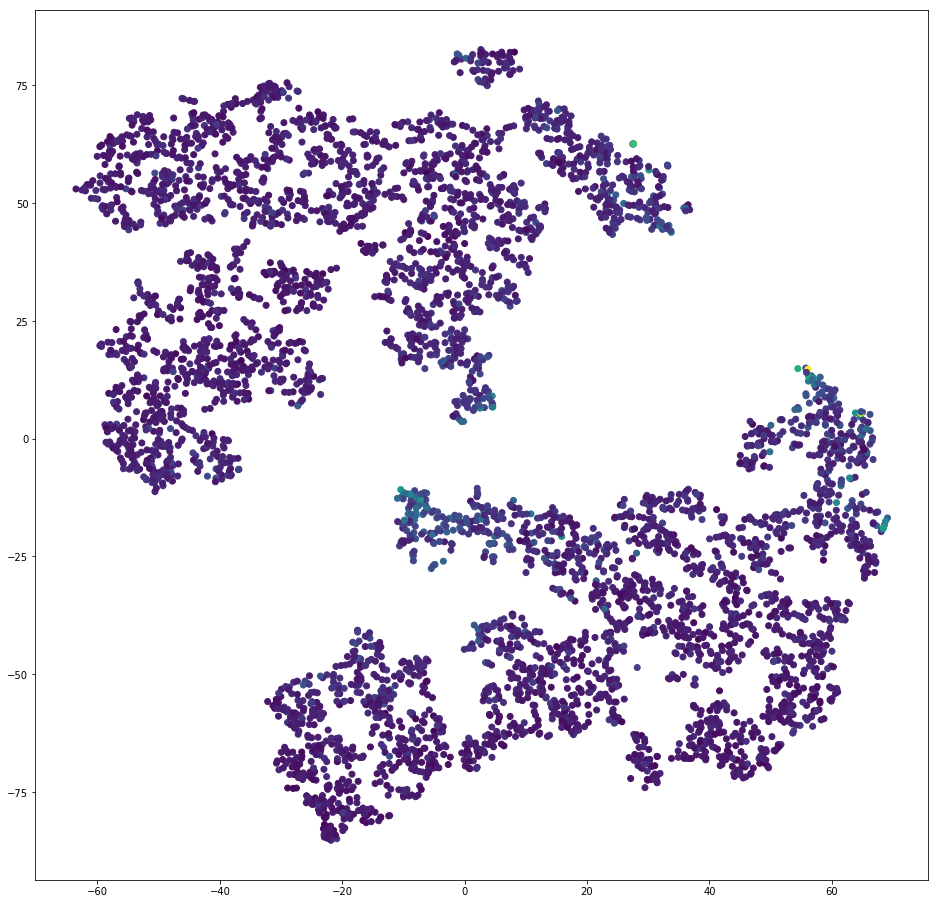

Standing Height (cm)


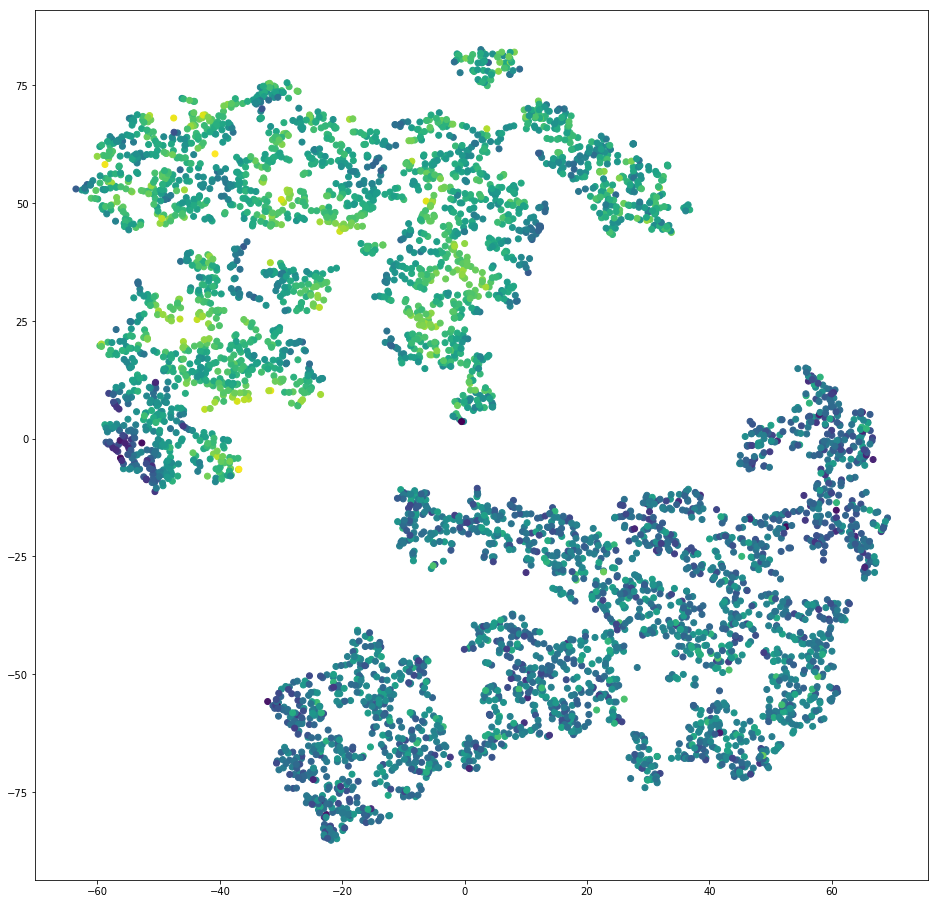

Total calcium (mmol/L)


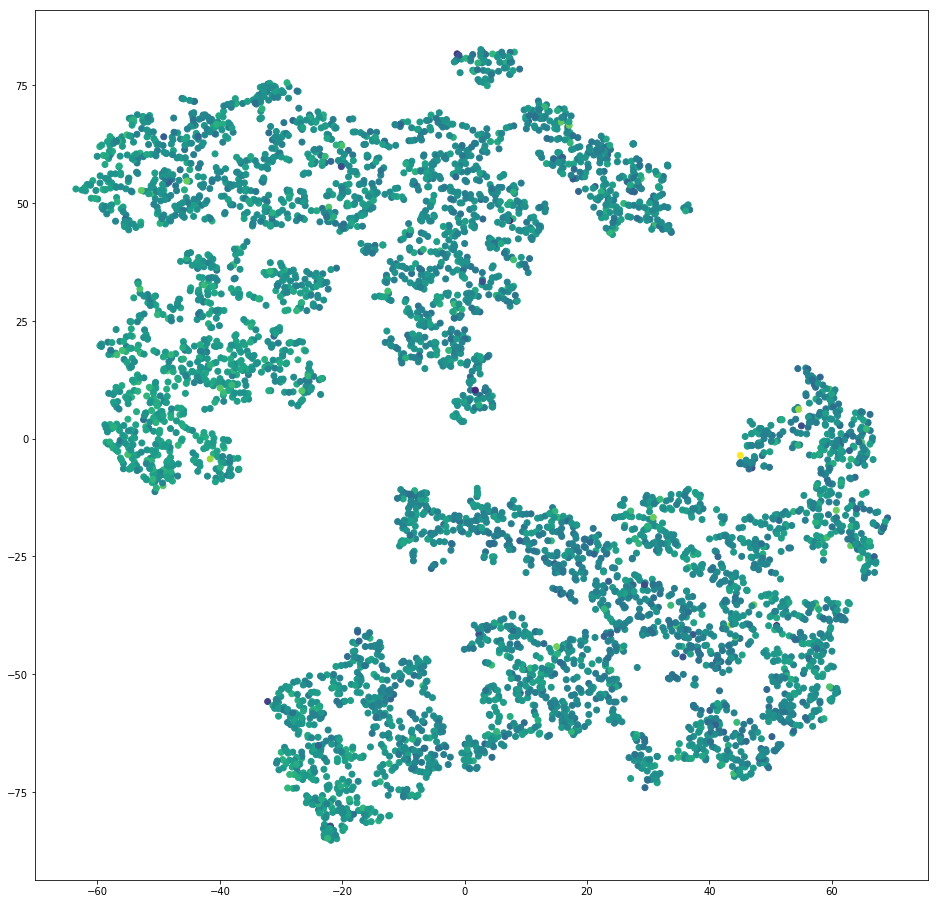

Total protein (g/L)


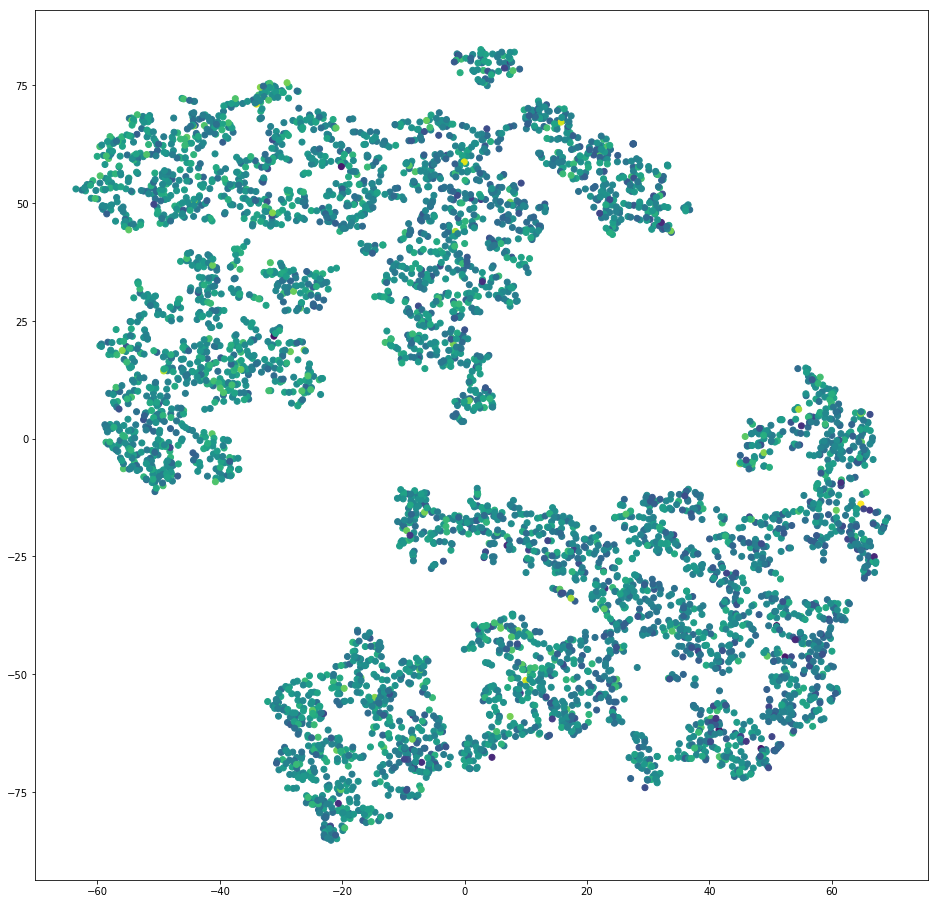

Triglycerides (mmol/L)


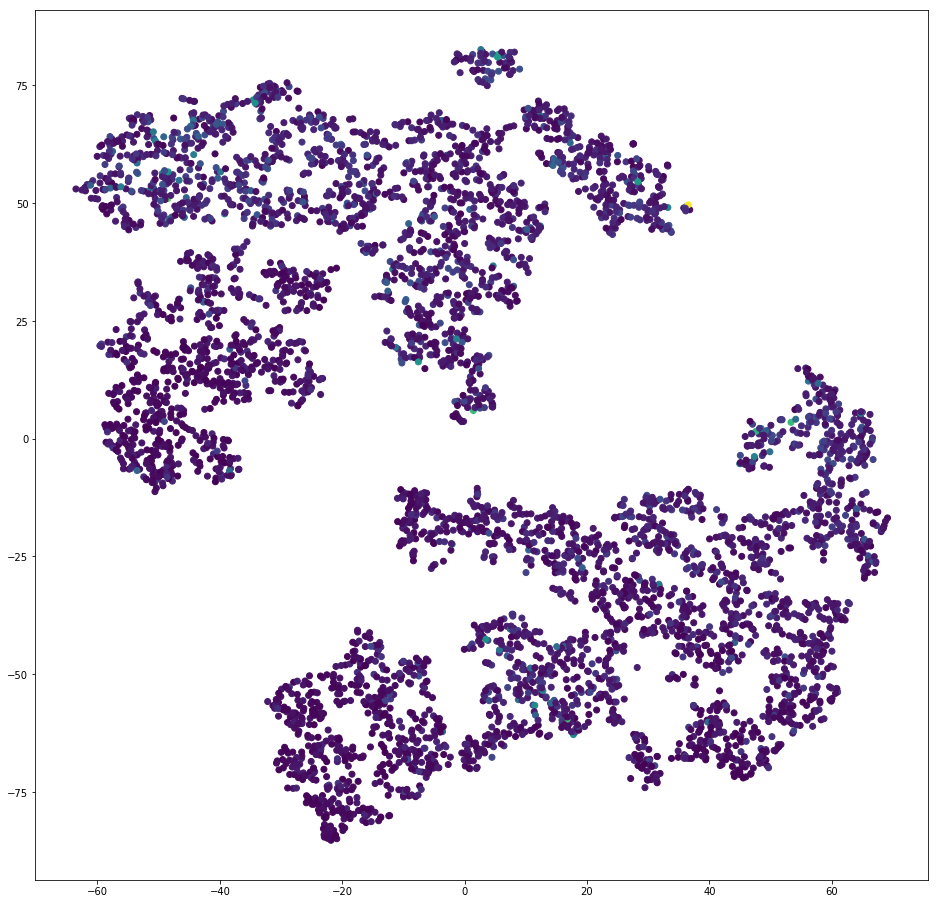

Waist Circumference (cm)


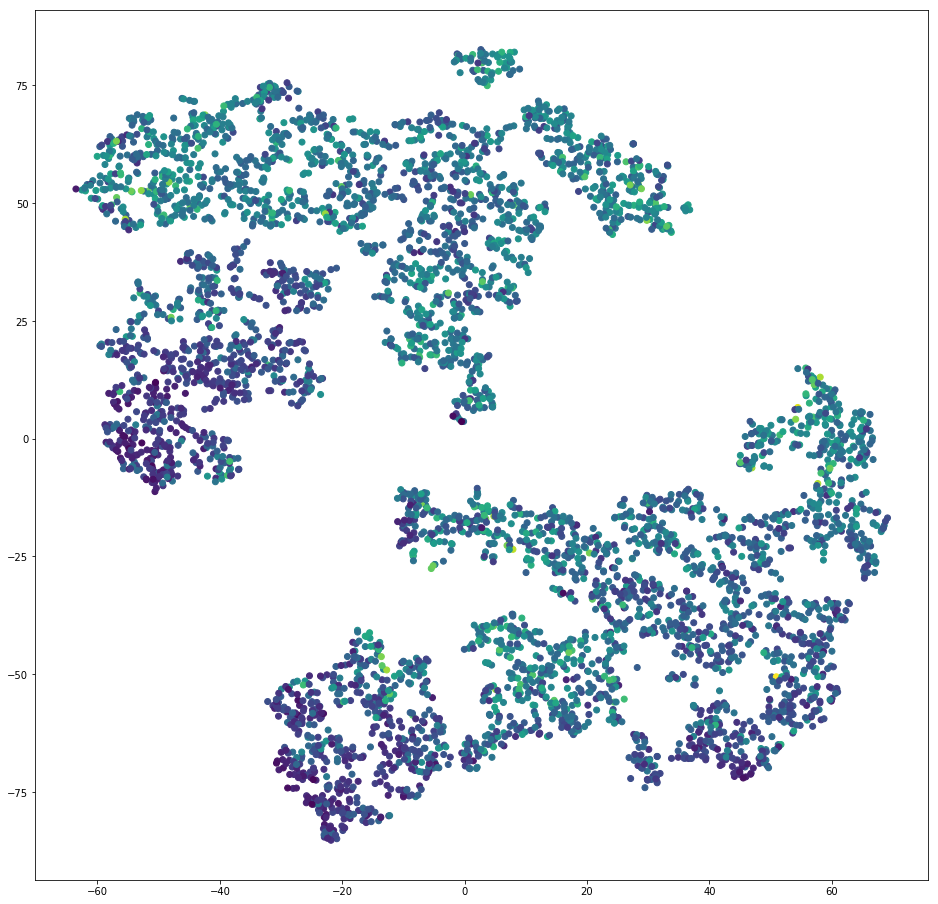

Weight (kg)


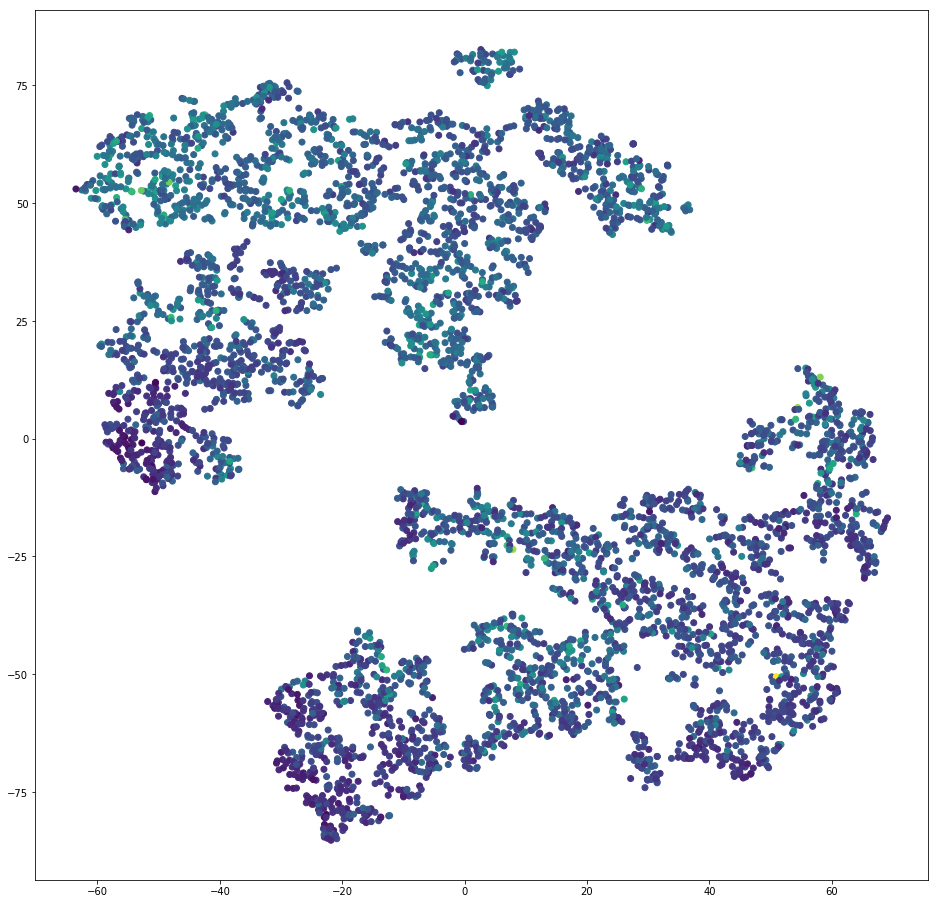

White blood cell count (1000 cells/uL)


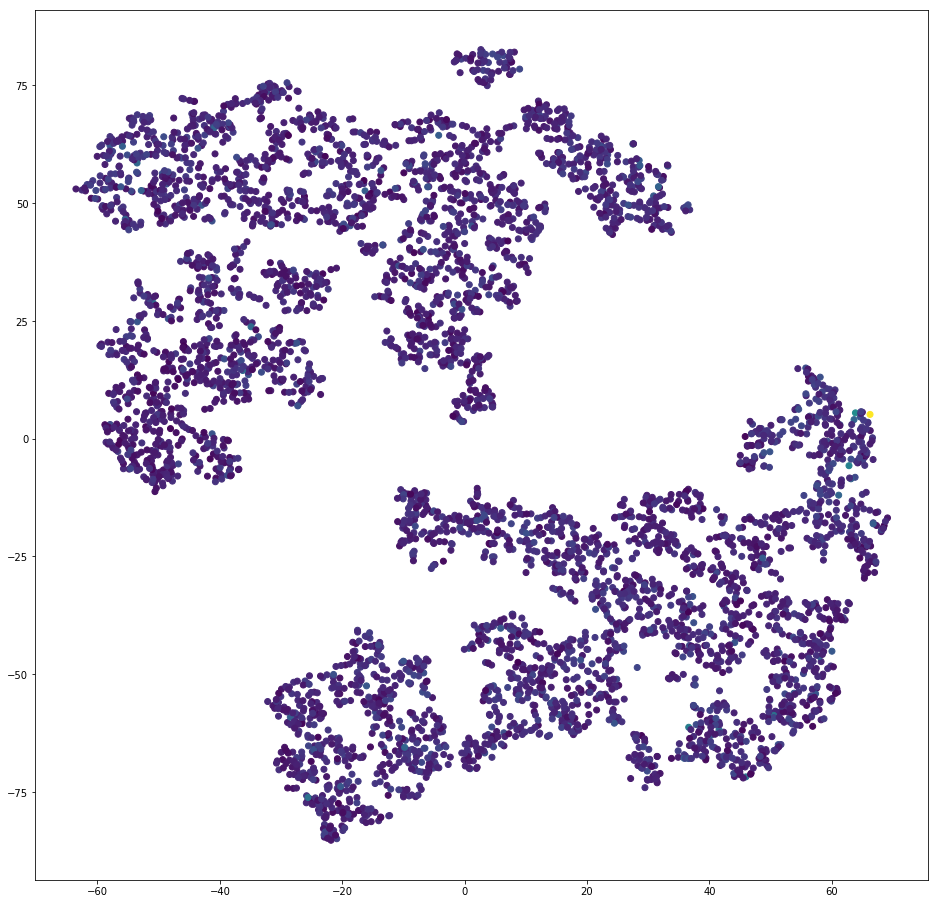

In [42]:
observed =  std_scale.inverse_transform(X_test) 
for i in range(observed.shape[1]-1):
    col= std_scale.inverse_transform(X_test) [:,i]
    maxi = max(col)
    mini = min(col)
    rangei = (maxi-mini)*1.
    normalized = [(n-mini)/rangei for n in col]
    color = [str(n) for n in normalized]
    from matplotlib import cm

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])

    plt.figure(figsize=(16, 16)) 
    plt.scatter(x,y,c=color)
    print(cols[i])
    plt.show()


In [43]:
not_any_ages = np.copy(X_test[:,:-1])
not_any_ages

array([[ 0.125     ,  0.41666667,  0.25      , ...,  0.49159664,
         0.60223048, -0.46153846],
       [-1.        ,  0.08333333,  0.        , ...,  0.78151261,
         0.89219331,  0.        ],
       [ 1.25      , -0.33333333,  0.75      , ..., -1.06722689,
        -1.04089219,  0.53846154],
       ...,
       [ 0.        , -0.58333333, -0.25      , ...,  0.49579832,
         1.01858736, -1.19230769],
       [ 0.75      ,  1.        , -0.75      , ...,  1.58403361,
         1.49070632, -0.76923077],
       [ 0.        ,  0.33333333,  0.        , ...,  1.53781513,
         1.94795539,  0.07692308]])

In [44]:
nans = np.ones((len(not_any_ages),1))*np.nan
no_ages = np.hstack( (not_any_ages, nans))
no_ages

array([[ 0.125     ,  0.41666667,  0.25      , ...,  0.60223048,
        -0.46153846,         nan],
       [-1.        ,  0.08333333,  0.        , ...,  0.89219331,
         0.        ,         nan],
       [ 1.25      , -0.33333333,  0.75      , ..., -1.04089219,
         0.53846154,         nan],
       ...,
       [ 0.        , -0.58333333, -0.25      , ...,  1.01858736,
        -1.19230769,         nan],
       [ 0.75      ,  1.        , -0.75      , ...,  1.49070632,
        -0.76923077,         nan],
       [ 0.        ,  0.33333333,  0.        , ...,  1.94795539,
         0.07692308,         nan]])

In [45]:
true_ages = std_scale.inverse_transform(X_test) [:,-1:]
true_ages

array([[32.],
       [69.],
       [17.],
       ...,
       [22.],
       [47.],
       [37.]])

In [46]:
def kl_divergence(a_code, a_latent_dim):
    return(tfp.distributions.kl_divergence(
            a_code,
            tfp.distributions.MultivariateNormalDiag(
                loc=tf.zeros(a_latent_dim),
                scale_diag=(tf.ones(a_latent_dim))
            )))

In [47]:
really_not_any_ages = std_scale.inverse_transform(no_ages)[:,:-1]
really_not_any_ages

array([[ 74. ,  25. ,   4.4, ..., 105.3,  90.9,   5.7],
       [ 56. ,  21. ,   4.3, ..., 112.2,  98.7,   6.9],
       [ 92. ,  16. ,   4.6, ...,  68.2,  46.7,   8.3],
       ...,
       [ 72. ,  13. ,   4.2, ..., 105.4, 102.1,   3.8],
       [ 84. ,  32. ,   4. , ..., 131.3, 114.8,   4.9],
       [ 72. ,  24. ,   4.3, ..., 130.2, 127.1,   7.1]])

Add different values for the following cell to see how anomalous this individual is and how the VAE converts it to a value without noise, which in this case is the biological age because the biomarkers correct the age.

In [48]:
pickaperson = 40

In [49]:
age_span = np.arange(0,100,0.5).reshape((200,1))

In [50]:
one_person =np.tile(really_not_any_ages[pickaperson],(200,1))

In [51]:
age_samples = np.hstack((one_person,age_span))

In [52]:
transformed_samples = std_scale.transform(age_samples)
transformed_samples
test = np.vstack((transformed_samples , np.random.rand(5,26)-0.5))

In [53]:
test

array([[-0.25      ,  0.91666667, -0.25      , ...,  0.96654275,
        -0.53846154, -1.        ],
       [-0.25      ,  0.91666667, -0.25      , ...,  0.96654275,
        -0.53846154, -0.98717949],
       [-0.25      ,  0.91666667, -0.25      , ...,  0.96654275,
        -0.53846154, -0.97435897],
       ...,
       [-0.28706226,  0.40562293,  0.43135687, ..., -0.12881397,
         0.21467561, -0.44974622],
       [-0.04098124, -0.19685383,  0.45218563, ..., -0.20726791,
         0.20545756,  0.37218394],
       [ 0.10748902, -0.13527021, -0.07540555, ...,  0.39949306,
        -0.2642689 , -0.30112597]])

In [54]:
#age_codes = encoder2(transformed_samples)
age_codes_with_rand = encoder2(test)
age_codes_with_rand

<tfp.distributions.MultivariateNormalTriL 'encoder2_multivariate_normal_tri_l_MultivariateNormalTriL_MultivariateNormalTriL' batch_shape=[205] event_shape=[5] dtype=float32>

In [55]:
divergences = np.array(kl_divergence(age_codes_with_rand, latent_dim))
divergences

array([11.062509 , 11.073222 , 11.088789 , 11.109197 , 11.134443 ,
       11.164517 , 11.199419 , 11.239133 , 11.291403 , 11.36469  ,
       11.465134 , 11.592736 , 11.747483 , 11.929368 , 12.1384   ,
       12.374562 , 12.637848 , 12.9282675, 13.245816 , 13.590489 ,
       13.962271 , 14.361171 , 14.787186 , 15.2403   , 15.720537 ,
       15.998254 , 15.890478 , 15.786492 , 15.686289 , 15.589893 ,
       15.497242 , 15.452921 , 15.416448 , 15.380465 , 15.34498  ,
       15.309975 , 15.275474 , 15.24144  , 15.207918 , 15.174866 ,
       15.142309 , 15.11024  , 15.078659 , 15.047572 , 15.016965 ,
       14.986847 , 14.9572115, 14.92805  , 14.899393 , 14.8712225,
       14.843522 , 14.816329 , 14.789614 , 14.76338  , 14.73764  ,
       14.712382 , 14.687604 , 14.663321 , 14.639504 , 14.61619  ,
       14.593355 , 14.571002 , 14.549137 , 14.527768 , 14.507448 ,
       14.488556 , 14.469725 , 14.450999 , 14.432342 , 14.413763 ,
       14.395279 , 14.376865 , 14.358538 , 14.340294 , 14.3221

In [56]:
true_ages[pickaperson]

array([61.])

In [57]:
expected_ages[pickaperson]

array([68.27276695])

In [58]:
age_span_with_rand = np.arange(0,102.5,0.5).reshape((205,1))

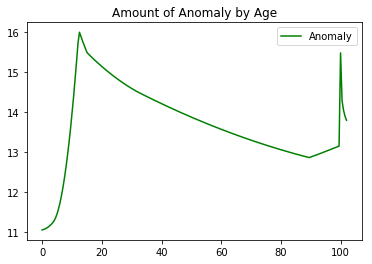

<Figure size 432x288 with 0 Axes>

In [59]:
ages =age_span_with_rand.flatten()
strangeness =divergences.flatten()
plt.plot(ages, strangeness, 'g', label='Anomaly')
plt.title('Amount of Anomaly by Age')
plt.legend(loc=0)
plt.figure()


plt.show()

In [60]:
age_samples

array([[ 68. ,  31. ,   4.2, ..., 100.7,   5.5,   0. ],
       [ 68. ,  31. ,   4.2, ..., 100.7,   5.5,   0.5],
       [ 68. ,  31. ,   4.2, ..., 100.7,   5.5,   1. ],
       ...,
       [ 68. ,  31. ,   4.2, ..., 100.7,   5.5,  98.5],
       [ 68. ,  31. ,   4.2, ..., 100.7,   5.5,  99. ],
       [ 68. ,  31. ,   4.2, ..., 100.7,   5.5,  99.5]])

In [61]:
distr =tfp.distributions.MultivariateNormalDiag(
                loc=tf.zeros(latent_dim),
                scale_diag=(tf.ones(latent_dim))
            )
kl_divergence (distr,latent_dim)

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [62]:
pickatime =90  #how many 6 month periods

In [63]:
age_code = encoder2(transformed_samples[pickatime].reshape(1,-1))
age_code

<tfp.distributions.MultivariateNormalTriL 'encoder2_multivariate_normal_tri_l_MultivariateNormalTriL_MultivariateNormalTriL' batch_shape=[1] event_shape=[5] dtype=float32>

In [64]:
np.array (kl_divergence(age_code, latent_dim))

array([14.042566], dtype=float32)

However, we can take the same array, one with the incorrect ages inserted in, and show that autoencoder can correct them.

In [65]:
age_codes = encoder2(transformed_samples)
age_codes

<tfp.distributions.MultivariateNormalTriL 'encoder2_multivariate_normal_tri_l_MultivariateNormalTriL_MultivariateNormalTriL' batch_shape=[200] event_shape=[5] dtype=float32>

In [66]:
expected_dist = decoder2(age_codes.loc)
age_corrections_transformed=expected_dist.mean()
corrected_ages= std_scale.inverse_transform(age_corrections_transformed) [:,-1:]
corrected_ages

array([[34.7682302 ],
       [37.81602341],
       [40.86364692],
       [43.91157496],
       [46.95927054],
       [50.00688243],
       [53.05436996],
       [56.1021992 ],
       [62.49132907],
       [69.45015335],
       [76.40902877],
       [77.51644063],
       [75.05875397],
       [72.60110217],
       [70.14294595],
       [67.69256544],
       [65.24221283],
       [62.79184163],
       [60.34142858],
       [58.20963424],
       [56.53672966],
       [54.86381695],
       [53.19089958],
       [51.52201071],
       [49.85452241],
       [49.02342886],
       [49.63739258],
       [50.25129354],
       [50.86523983],
       [51.47909662],
       [52.09306151],
       [52.38230565],
       [52.61950359],
       [52.85671431],
       [53.09424582],
       [53.33215973],
       [53.57002598],
       [53.80798057],
       [54.04585031],
       [54.28373399],
       [54.52158049],
       [54.759556  ],
       [54.99738622],
       [55.23526642],
       [55.47313964],
       [55

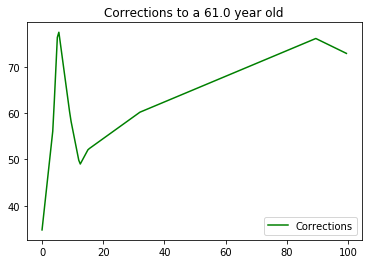

<Figure size 432x288 with 0 Axes>

In [67]:
ages =age_span.flatten()
corrected =corrected_ages.flatten()
plt.plot(ages, corrected, 'g', label='Corrections')
plt.title('Corrections to a {0} year old'.format(true_ages[pickaperson][0]))
plt.legend(loc=0)
plt.figure()


plt.show()

The chart illustrates that if an incorrect age is put in the autoencoder, that a correct age comes back in the test set.  This is what would happen if your biological age is different from your chronological age,so the VAE can do this than it is a biological age calculator. Incorrect ages entered are on the x axis, and corrections are on the y axis.  Visually, look for when the curve has a close to horizontal line around the age of the person, or a local minima, taking into account y axis range.  True age is on the Y axis and the false age put in is the x axis.

In [68]:
index = int(true_ages[pickaperson]*2)

In [69]:
corrected_ages[index]

array([68.27276695])

In the below cell pick an age to see what it is corrected to in the above chart

In [70]:
pickanage = 77

In [71]:
index = int(pickanage*2)
corrected_ages[index]

array([72.71158952])

Our original problem is many NANs in otherwise usable data, data that is needed to increase the accuracy of our neural network.  As long as there are dependencies between the independent variables, those dependencies can be used to impute with VAE.

We take our imputation algorithm from https://www.sciencedirect.com/science/article/pii/S2405896318320949.

Variational Autoencoders for Missing Data Imputation with Application to a Simulated Milling Circuit

John T. McCoy, Steve Kroon+, Lidia Auret

Replace missing values in data with random values;

Input the data to the trained VAE: a. Sample from the latent variable distribution (the output of the encoder) to generate Z, given X; b. Sample from the reconstructed data distribution (the output of the decoder) to generate 𝑋𝑋 ̂, given Z.

Replace the missing values with the reconstructed values, leaving the observed values unchanged;

Compute the reconstruction error of the observed values;

If the reconstruction error is below a specified tolerance, or the iteration limit has been reached, end.

Otherwise, return to step 2.

In [72]:
def impute_data(encoder,decoder, data, tolerance =0.1, iteration_limit = 1000):
    #using the vae, impute every place that has np.nan in the data ndarray
    #remember to apply any sklearn StandardScaler before this routine
    import numpy.ma as ma
    loc = np.where(np.isnan(data))
    #Replace missing values in data with the avg of the column, or zero of all in column are nan
    #adjusted = np.where(np.isnan(data), ma.array(data, mask=np.isnan(data)).mean(axis=0), data)  
    random_replace = np.vectorize(lambda x: (np.random.random()-0.5) if np.isnan(x) else x)
    adjusted = random_replace(data)
    iter_count =0
    mae = tolerance +1
    while iter_count < iteration_limit and mae > tolerance:
        #Input the data to the trained VAE
        #use the means of the distributions to get a deterministic prediction
        codes = encoder(adjusted)
        normals = decoder(codes.loc)
        means = normals.mean()
        results = np.array(means)
        #print(results[0])
        #results = vae.predict(adjusted)
        #diff = results-adjusted
        #Replace the missing values with the reconstructed values, leaving the observed values unchanged
        adjusted[loc] = results[loc]
        diff = results-adjusted
        #Compute the reconstruction error of the observed values
        mae = np.mean(abs(diff))
        iter_count += 1
        print ("{0}:{1}".format(iter_count,mae))
    
    return adjusted

In [73]:
import numpy as np
import pandas as pd
# NOTE: Make sure that the class is labeled 'target' in the data file
filename = '_NHANES_TESTS_MERGED.csv'
df = pd.read_csv(filename, sep=',', dtype=np.float64)


target = 'Age at Screening Adjudicated Recode'

cols = list(df.columns.values) #Make a list of all of the columns in the df
cols.pop(cols.index(target)) #Remove b from list
dfy = df[cols+[target]] 
data = dfy.to_numpy()
np.random.shuffle(data)
X = data[:,:-1]
y = data[:,-1]



In [75]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt 
from sklearn import preprocessing
import random

batch_size = 100000
buffer_size = 1000
num_epochs=12000

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, test_size=0.25,random_state=142)

std_scale = preprocessing.RobustScaler().fit(X_train)
# Normalize Testing Data by using mean and SD of training set
X_test = std_scale.transform(X_test)

for i in range (0,100,10):
    #put nans in data set
    X_train_trans = np.copy(std_scale.transform(X_train))
    print("Erasing {0} percent of data...".format(i))
    for j in range (X_train_trans.shape[0]):
        nans = random.sample(range(X_train_trans.shape[1]), k=(int(X_train_trans.shape[1]*i*0.01)))
        np.put(X_train_trans[j], nans, [np.nan])
    #impute data
    imputed = impute_data(encoder2,decoder2,X_train_trans)
    #run model
    training_dataset = tf.data.Dataset.from_tensor_slices((imputed,y_train))
    training_dataset = training_dataset.shuffle(buffer_size)
    training_dataset = training_dataset.batch(batch_size)

    testing_dataset = tf.data.Dataset.from_tensor_slices((X_test,y_test))
    testing_dataset = testing_dataset.shuffle(buffer_size)
    testing_dataset = testing_dataset.batch(batch_size)
    model = tf.keras.models.Sequential([
        #tf.keras.layers.Lambda(lambda x: tf.expand_dims(x, axis=-1),
                          #input_shape=[None]
        tf.keras.layers.Dense(20, input_shape=[25], activation="relu"), 
        tf.keras.layers.Dense(20, activation="relu"), 
        #tf.keras.layers.Dropout(0.2),
        #tf.keras.layers.Dense(20, activation="relu"), 
        #tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(10, activation="relu"),
        #tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Dense(1)
    ])

    csvLogger = tf.keras.callbacks.CSVLogger("nhanes_more.{0}.csv".format(i), separator=',', append=False)

    model.compile(loss="mse", optimizer=tf.keras.optimizers.RMSprop(lr=1e-3), metrics=["mae"])

    #model.compile(loss="mse", optimizer=tf.keras.optimizers.Adam(), metrics=["mae"])

    history = model.fit(training_dataset,epochs=num_epochs,validation_data = testing_dataset, callbacks = [csvLogger],verbose = 1)
    model.save('nhanes_model_{0}.h5'.format(i)) 


Erasing 0 percent of data...


InvalidArgumentError: Matrix size-incompatible: In[0]: [22578,25], In[1]: [26,20]
	Encountered when executing an operation using EagerExecutor. This error cancels all future operations and poisons their output tensors. [Op:MatMul]